In [1]:
#import packages
import csv
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import datasets
import scipy.stats as stats
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import decomposition
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from statsmodels.graphics.gofplots import qqplot
from matplotlib import pyplot
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.metrics import roc_auc_score, average_precision_score, plot_roc_curve, plot_precision_recall_curve, roc_curve

import warnings
warnings.filterwarnings("ignore")

In [2]:
#reading in the data
data = pd.read_csv("data_clean.csv", index_col=[0])

In [3]:
data.job_satisfaction.unique()

array([ 9,  5,  8,  1, 10,  7,  4,  3,  2,  0,  6])

# Assessing the distribution of Job Satisfaction which we will be using as our target variable

We'll start by looking at our target, which is going to be job satisfaction throughout the modelling. We need to check to see whether the class is imbalanced or not, as well as redefine it in terms of a neater classification problem - that is by putting the data into 3 classes with more datapoints in each and predicting those rather than in the current 11. 

Here we'll also ensure that nominal data is reclassified using dummy variables. 

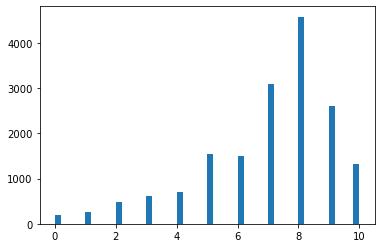

In [19]:
#plot the data to get a better understanding of the distribution
pyplot.hist(data['job_satisfaction'], bins=50)
pyplot.show()

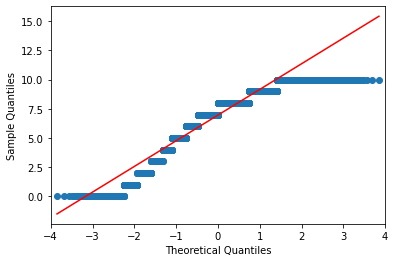

In [20]:
#do the same thing using a QQ plot
qqplot(data['job_satisfaction'], line='s')
pyplot.show()

It looks as though out data is slightly skewed, however it's not too unbalanced to continue as is. 

We also need to change a couple of columns that contain string data so that we can use them in our modelling. 

In [21]:
#We'll do this using 'get dummies'
data = pd.get_dummies(data, columns=['country', 'job_description', 'qual_field'])

In [22]:
#check the dummifying has worked correctly.
data.head()

,gender,age,current_job,work_situation_1,work_situation_2,work_situation_3,company_type,company_industry,company_size,role_changes_1,...,qual_field_Engineering,"qual_field_Humanities, Languages & Arts",qual_field_Maths,qual_field_Medicine & Healthcare,qual_field_Natural Sciences,qual_field_Not applicable,qual_field_Other specific subject areas,"qual_field_Security, transport & personal services",qual_field_Social Sciences,qual_field_Teacher training & education sciences
ID,,,,,,,,,,,,,,,,,,,,,
AT_250016,2,30,7,0,0,0,2,13,8,0,...,0,0,0,0,0,0,0,0,0,1
AT_250017,2,39,5,1,0,0,1,5,6,0,...,0,0,0,0,0,0,0,0,1,0
AT_250036,1,59,5,1,0,0,2,10,2,0,...,0,0,0,0,0,0,0,0,0,0
AT_250039,2,27,7,1,0,0,3,15,2,0,...,0,0,0,0,0,0,0,0,0,1
AT_250051,2,32,4,1,0,0,3,15,1,0,...,0,0,0,0,0,0,0,0,0,1


In [23]:
#once again check
print(list(data.columns))

['gender', 'age', 'current_job', 'work_situation_1', 'work_situation_2', 'work_situation_3', 'company_type', 'company_industry', 'company_size', 'role_changes_1', 'role_changes_2', 'role_changes_3', 'role_changes_4', 'role_changes_5', 'part/full_time', 'employment_contract', 'non_routine_work', 'learning_new_things', 'choosing_way_work', 'teamwork', 'job_satisfaction', 'qual_level', 'vocational_quals', 'qual_needed_have', 'qual_needed_do', 'skill_rating', 'literacy_needed', 'numeracy_needed', 'IT_needed', 'skill_needed_technical', 'skill_needed_communication', 'skill_needed_teamwork', 'skill_needed_foreign_lang', 'skill_needed_customer_handling', 'skill_needed_problem_solving', 'skill_needed_learning', 'skill_needed_planning_organisation', 'skill_match_technical', 'skill_match_communication', 'skill_match_teamwork', 'skill_match_foreign_lang', 'skill_match_customer_handling', 'skill_match_problem_solving', 'skill_match_learning', 'skill_match_planning_organisation', 'skill_match', 'ski

In [24]:
#make a new dataframe from the old one - this is so we can change the job satsfaction information.
new_data = data

In [25]:
#what does the current job satisfaction data look like?
new_data.job_satisfaction.describe()

count    16926.000000
mean         6.954981
std          2.201996
min          0.000000
25%          6.000000
50%          8.000000
75%          8.000000
max         10.000000
Name: job_satisfaction, dtype: float64

In [26]:
new_data.job_satisfaction.median()

8.0

In [27]:
#split up the y values into 3 classifications with which to compare accuracy with

In [28]:
new_data.loc[new_data['job_satisfaction'] == 0, 'job_satisfaction'] = 0
new_data.loc[new_data['job_satisfaction'] == 1, 'job_satisfaction'] = 0
new_data.loc[new_data['job_satisfaction'] == 2, 'job_satisfaction'] = 0
new_data.loc[new_data['job_satisfaction'] == 3, 'job_satisfaction'] = 0
new_data.loc[new_data['job_satisfaction'] == 4, 'job_satisfaction'] = 1
new_data.loc[new_data['job_satisfaction'] == 5, 'job_satisfaction'] = 1
new_data.loc[new_data['job_satisfaction'] == 6, 'job_satisfaction'] = 1
new_data.loc[new_data['job_satisfaction'] == 7, 'job_satisfaction'] = 2
new_data.loc[new_data['job_satisfaction'] == 8, 'job_satisfaction'] = 2
new_data.loc[new_data['job_satisfaction'] == 9, 'job_satisfaction'] = 2
new_data.loc[new_data['job_satisfaction'] == 10, 'job_satisfaction'] = 2

In [29]:
#identify the target variable
y = new_data['job_satisfaction']

In [30]:
new_data.job_satisfaction.median()

2.0

In [31]:
#and better understand what the information now looks like
new_data.job_satisfaction.describe()

count    16926.000000
mean         1.594175
std          0.652566
min          0.000000
25%          1.000000
50%          2.000000
75%          2.000000
max          2.000000
Name: job_satisfaction, dtype: float64

In [32]:
#this is our baseline for the whole of the dataset
y.value_counts(normalize=True)

2    0.686518
1    0.221139
0    0.092343
Name: job_satisfaction, dtype: float64

# Hypothesis 1 - Can we predict whether an individual is likely to enjoy their job? What factors determine this enjoyment?

Our first hypothesis looks at whether we can predict whether an individual is likely to enjoy their job. 

We're using accuracy as our indicator in determining the best model as we want to find whether we can better classify the number of people who are satisfied with their job as satisfied over and above the baseline. 

This will be further supplemented by the AUC and PRC scores. 

We will firstly be looking at Logistic Regression to get a feel for the data and then move on to boosting and bagging methods to investigate whether they offer any more accuracy to the hypothesis. 

## Logistic Regression with no penalties

We'll be using Logistic Regression as a baseline to find optimal results for each test. 

In [33]:
#Let's start by setting up our X and y - target and feature variables
X = data[['gender', 'age', 'current_job',  
                      'work_situation_1', 'work_situation_2',
                          'work_situation_3', 'company_type',
                           'company_industry', 'company_size', 'role_changes_1',
                            'role_changes_2', 'role_changes_3', 'role_changes_4',
                          'role_changes_5', 'part/full_time',
                           'employment_contract', 'non_routine_work', 'learning_new_things',
                           'choosing_way_work', 'teamwork',
                          'qual_level', 'vocational_quals',
                           'qual_needed_have', 'qual_needed_do', 'skill_rating',
                           'literacy_needed', 'numeracy_needed', 'IT_needed',
                            'skill_needed_technical',
                           'skill_needed_communication', 'skill_needed_teamwork',
                          'skill_needed_foreign_lang', 'skill_needed_customer_handling',
                            'skill_needed_problem_solving', 'skill_needed_learning',
                           'skill_needed_planning_organisation', 'skill_match_technical',
                           'skill_match_communication', 'skill_match_teamwork',
                            'skill_match_foreign_lang', 'skill_match_customer_handling',
                             'skill_match_problem_solving', 'skill_match_learning',
                             'skill_match_planning_organisation', 'skill_match',
                            'skill_development', 'skill_development_training_courses', 
                            'skill_development_on_the_job', 'skill_development_interacting_colleagues', 
                            'skill_development_trial_error', 'skill_development_learnt_self',
                             'skill_level_variety_tasks', 'skill_level_difficulty_task',
                             'skill_level_learn_new',
                            'skill_level', 'training_courses_at_work',
                            'training_courses_outside_work', 'training_courses_on_job',
                            'no_training',
                            'training_paid_you', 'training_paid_employer',
                            'training_paid_employer_part', 'training_paid_gvt',
                            'training_paid_someone_else',
                             'training_reasons_skill_need',
                            'training_reasons_comply',
                            'training_reasons_job_performance',
                           'training_reasons_career_prospects',
                            'training_reasons_personal',
                             'changes_workplace_technology',
                            'changes_workplace_methods',
                            'changes_workplace_products',
                           'changes_workplace_contact',
                             'changes_workplace_supported',
                         'occupation_change',
                           'factors_job_suited',
                            'factors_work_experience',
                             'factors_security',
                             'factors_career_progression',
                         'factors_company',
                           'factors_pay',
                            'factors_home',
                           'factors_interesting',
                             'factors_balance',
                            'before_few_opportunities_skills',
                          'before_few_opportunities_interviews',
                           'before_finding_work',
                          'before_more_offers',
                           'before_skill_level',
                            'lose_job',
                            'skills_outdated', 'country_Austria', 'country_Belgium', 
          'country_Bulgaria', 'country_Croatia', 'country_Cyprus', 
          'country_Czech Republic', 'country_Denmark', 'country_Estonia', 
          'country_Finland', 'country_France', 'country_Germany', 'country_Greece', 
          'country_Hungary', 'country_Ireland', 'country_Italy', 'country_Latvia', 
          'country_Lithuania', 'country_Luxembourg', 'country_Malta', 'country_Netherlands', 
          'country_Poland', 'country_Portugal', 'country_Slovakia', 'country_Slovenia', 
          'country_Spain', 'country_Sweden', 'country_United Kingdom', 
          'job_description_Agricultural, Forestry & Fishery Labourer', 
          'job_description_Another job requiring few or no skills', 'job_description_Assembler', 
          'job_description_Building & Related Trades Worker', 'job_description_Business & Administration', 
          'job_description_Cleaner or Helper', 'job_description_Customer Services Clerk', 
          'job_description_Drivers or Mobile Plant Operator', 
          'job_description_Electircal & Electronic Trades Worker', 
          'job_description_Food Preparation Assistant', 'job_description_General Clerk', 
          'job_description_Handicraft & Printing Worker', 'job_description_Health', 
          'job_description_Information & Communications Technology', 
          'job_description_Labourer in Mining, Construction, Manufacturing & Transport', 
          'job_description_Labourer in Mining, Construction, Manufacturing or Transport', 
          'job_description_Legal, Social & Cultural', 'job_description_Metal & Machinery Trades Worker', 
          'job_description_Numberical & Material Recording Clerk', 
          'job_description_Other Clerical Support Worker', 'job_description_Personal Care Worker', 
          'job_description_Personal Services Worker', 'job_description_Protective Service Worker', 
          'job_description_Sales Worker', 'job_description_Science & Engineering', 
          'job_description_Skilled Agricultural Worker', 
          'job_description_Skilled Forestry, Fishery & Hunting Worker',
          'job_description_Stationary Plant or Machine Operator', 
          'job_description_Street & other Sales or Services Worker', 
          'job_description_Street or Related Sales & Services Worker', 
          'job_description_Subsistance Farmer, Fisher, Hunter', 'job_description_Teaching', 
          'job_description_Worker in Another Skilled Trade', 'qual_field_Agriculture & Vet Sciences', 
          'qual_field_Computing', "qual_field_Don't know", 
          'qual_field_Economics, Business, Law & Finance', 'qual_field_Engineering', 
          'qual_field_Humanities, Languages & Arts', 'qual_field_Maths', 
          'qual_field_Medicine & Healthcare', 'qual_field_Natural Sciences', 
          'qual_field_Not applicable', 'qual_field_Other specific subject areas', 
          'qual_field_Security, transport & personal services', 'qual_field_Social Sciences', 
          'qual_field_Teacher training & education sciences']]

In [34]:
#split into training and test data
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split (X, y, stratify=y, test_size = 0.2, random_state=42)

In [35]:
#scale our data
scaler = StandardScaler()

X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

X_train = pd.DataFrame(X_train, columns=X.columns)
X_test = pd.DataFrame(X_test, columns=X.columns)

In [21]:
X_train.shape

(13540, 165)

In [22]:
y_train.shape

(13540,)

In [23]:
X_test.shape

(3386, 165)

In [24]:
y_test.shape

(3386,)

In [25]:
#using the logistic regression model
model = LogisticRegression()

In [26]:
model_none = LogisticRegression(penalty='none')

In [27]:
#fit the model
model_none.fit(X_train, y_train)

LogisticRegression(penalty='none')

In [28]:
#print the training, test and CV scores
print('Training score: ', model_none.score(X_train, y_train))
print('Test score: ', model_none.score(X_test, y_test))
print('CV score: ', (cross_val_score(model_none, X_train, y_train)).mean())

Training score:  0.7175775480059084
Test score:  0.7114589486119315
CV score:  0.7064254062038404


In [29]:
#print the classification report
yhat_model_none = model_none.predict(X_test)
yhat_pp_model_none = model_none.predict_proba(X_test)
print(classification_report(y_test, yhat_model_none))

              precision    recall  f1-score   support

           0       0.50      0.21      0.29       313
           1       0.45      0.19      0.27       749
           2       0.75      0.95      0.84      2324

    accuracy                           0.71      3386
   macro avg       0.56      0.45      0.47      3386
weighted avg       0.66      0.71      0.66      3386



In [30]:
#print the ROC-AUC score
roc_auc_score(y_test, yhat_pp_model_none, multi_class='ovo')

0.7069046900293404

In [31]:
from sklearn.metrics import plot_precision_recall_curve

In [32]:
import scikitplot as skplt

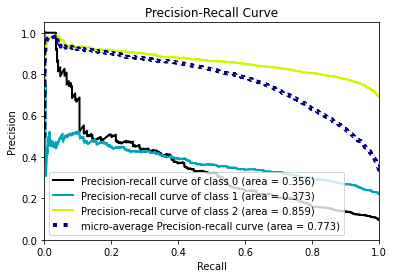

In [33]:
#plot the precision-recall curve
skplt.metrics.plot_precision_recall(y_test, yhat_pp_model_none)
plt.show()

## Logistic Regression with Lasso Regression

Fitting a Logistic Regression with a Lasso penalty shrinks the regression coefficients toward zero by penalising the regression model with a penalty of the sum of the absolute coefficients.

This penalty has the effect of forcing some of the coefficient estimates that have a minor contribution to the model, to be exactly equal to zero and reduces the complexity of the model without you having to select a subset of the data.

In [34]:
model_l1 = LogisticRegression(penalty='l1', solver='liblinear')

In [35]:
#fit the model
model_l1.fit(X_train, y_train)

LogisticRegression(penalty='l1', solver='liblinear')

In [36]:
#print the training, test and CV scores
print('Training score: ', model_l1.score(X_train, y_train))
print('Test score: ', model_l1.score(X_test, y_test))
print('CV score: ', (cross_val_score(model_l1, X_train, y_train)).mean())

Training score:  0.7146971935007386
Test score:  0.7108682811577082
CV score:  0.7076809453471196


In [37]:
#print the classification report
yhat_model_l1 = model_l1.predict(X_test)
yhat_pp_model_l1 = model_l1.predict_proba(X_test)
print(classification_report(y_test, yhat_model_l1))

              precision    recall  f1-score   support

           0       0.52      0.16      0.25       313
           1       0.44      0.17      0.25       749
           2       0.74      0.96      0.84      2324

    accuracy                           0.71      3386
   macro avg       0.57      0.43      0.44      3386
weighted avg       0.66      0.71      0.65      3386



In [38]:
#print the ROC/AUC score
roc_auc_score(y_test, yhat_pp_model_l1, multi_class='ovo')

0.7008634724509891

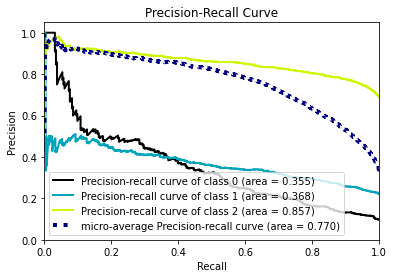

In [40]:
#plot the precision-recall curve
skplt.metrics.plot_precision_recall(y_test, yhat_pp_model_l1)
plt.show()

## Logistic Regression with Ridge Regression

Fitting a Logistic Regression with a Ridge penalty shrinks the regression coefficients so that variables with minor contribution to the outcome have their coefficients close to zero.

Ridge regression shrinks the coefficients towards zero, but it will not set any of them exactly to zero.

In [41]:
model_l2 = LogisticRegression(penalty='l2')

In [42]:
#fit the model
model_l2.fit(X_train, y_train)

LogisticRegression()

In [43]:
#print the training, test and CV scores
print('Training score: ', model_l2.score(X_train, y_train))
print('Test score: ', model_l2.score(X_test, y_test))
print('CV score: ', (cross_val_score(model_l2, X_train, y_train)).mean())

Training score:  0.7176514032496307
Test score:  0.7114589486119315
CV score:  0.7064992614475628


In [44]:
#print the classification report
yhat_model_l2 = model_l2.predict(X_test)
yhat_pp_model_l2 = model_l2.predict_proba(X_test)
print(classification_report(y_test, yhat_model_l2))

              precision    recall  f1-score   support

           0       0.50      0.21      0.29       313
           1       0.45      0.19      0.27       749
           2       0.75      0.95      0.84      2324

    accuracy                           0.71      3386
   macro avg       0.56      0.45      0.47      3386
weighted avg       0.66      0.71      0.66      3386



In [45]:
#print the ROC AUC score
roc_auc_score(y_test, yhat_pp_model_l2, multi_class='ovo')

0.706895696118608

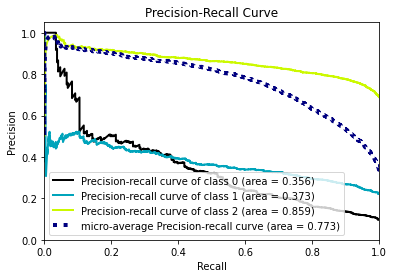

In [46]:
#plot the precision-recall curve
skplt.metrics.plot_precision_recall(y_test, yhat_pp_model_l2)
plt.show()

## Logistic Regression with Elastic Net

Fitting a Logistic Regression with an Elastic Net produces a regression model that is penalized with both Lasso and Ridge Regression. The consequence of this is to effectively shrink coefficients (like in Ridge) and to set some coefficients to zero (as in Lasso).

In [47]:
model_elastic_net = LogisticRegression(penalty='elasticnet', solver='saga', l1_ratio = 0.5)

In [48]:
#fit the model
model_elastic_net.fit(X_train, y_train)

LogisticRegression(l1_ratio=0.5, penalty='elasticnet', solver='saga')

In [49]:
#print the classification report
yhat_model_elastic_net = model_elastic_net.predict(X_test)
yhat_pp_model_elastic_net = model_elastic_net.predict_proba(X_test)
print(classification_report(y_test, yhat_model_elastic_net))

              precision    recall  f1-score   support

           0       0.50      0.21      0.29       313
           1       0.45      0.19      0.27       749
           2       0.75      0.95      0.84      2324

    accuracy                           0.71      3386
   macro avg       0.57      0.45      0.47      3386
weighted avg       0.66      0.71      0.66      3386



In [50]:
#print the training, test and CV scores
print('Training score: ', model_elastic_net.score(X_train, y_train))
print('Test score: ', model_elastic_net.score(X_test, y_test))
print('CV score: ', (cross_val_score(model_elastic_net, X_train, y_train)).mean())

Training score:  0.717725258493353
Test score:  0.7117542823390431
CV score:  0.7066469719350075


## Logistic Regression with Grid Search

Use a grid search to identify the best parameters for a regression. 

In [51]:
#setting up a number of parameters to try
params = {'C': np.logspace(-5, 5, 15),
          'penalty': ['l1', 'l2', 'elasticnet']
          }

In [52]:
#setting up the grid search
gs = GridSearchCV(estimator=model,
                  param_grid=params,
                  cv=5,
                  scoring='accuracy',
                  return_train_score=True,
                  n_jobs=2)

In [53]:
#fitthe model
gs.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=LogisticRegression(), n_jobs=2,
             param_grid={'C': array([1.00000000e-05, 5.17947468e-05, 2.68269580e-04, 1.38949549e-03,
       7.19685673e-03, 3.72759372e-02, 1.93069773e-01, 1.00000000e+00,
       5.17947468e+00, 2.68269580e+01, 1.38949549e+02, 7.19685673e+02,
       3.72759372e+03, 1.93069773e+04, 1.00000000e+05]),
                         'penalty': ['l1', 'l2', 'elasticnet']},
             return_train_score=True, scoring='accuracy')

In [54]:
#print the training, test and CV scores
print('Training score: ', gs.score(X_train, y_train))
print('Test score: ', gs.score(X_test, y_test))
print('CV score: ', (cross_val_score(gs, X_train, y_train)).mean())

Training score:  0.71698670605613
Test score:  0.7117542823390431
CV score:  0.7084194977843427


In [55]:
#find the best scores and best parameters
print('Best score: ', gs.best_score_)
print('Mean cross validation score: ', cross_val_score(gs.best_estimator_, X_train, y_train, cv=5).mean())
print('Best parameters: ', gs.best_params_)
print('Best estimator: ', gs.best_estimator_)

Best score:  0.7081240768094534
Mean cross validation score:  0.7081240768094534
Best parameters:  {'C': 0.0071968567300115215, 'penalty': 'l2'}
Best estimator:  LogisticRegression(C=0.0071968567300115215)


In [56]:
# print the classification report
yhat = gs.predict(X_test)
yhat_pp = gs.predict_proba(X_test)
print(classification_report(y_test, yhat))

              precision    recall  f1-score   support

           0       0.51      0.19      0.27       313
           1       0.44      0.18      0.26       749
           2       0.75      0.95      0.84      2324

    accuracy                           0.71      3386
   macro avg       0.57      0.44      0.46      3386
weighted avg       0.66      0.71      0.66      3386



In [57]:
# Create a DataFrame to look at the coefficients
coef_df_grid = pd.DataFrame({'feature': X.columns,
                        'coef': gs.best_estimator_.coef_[0],
                            'abs_coef': np.abs(gs.best_estimator_.coef_[0])})

In [58]:
#turning the coefficients into absolute values
coef_df_grid = coef_df_grid.sort_values(by='abs_coef', ascending=False)
coef_df_grid.head(12)

,feature,coef,abs_coef
89,lose_job,0.186372,0.186372
18,choosing_way_work,0.162340,0.162340
16,non_routine_work,-0.154156,0.154156
82,factors_interesting,-0.111693,0.111693
70,changes_workplace_methods,0.110484,0.110484
51,skill_level_variety_tasks,-0.108208,0.108208
44,skill_match,-0.107461,0.107461
17,learning_new_things,0.106794,0.106794
59,training_paid_you,0.102020,0.102020
12,role_changes_4,0.099184,0.099184


Text(0, 0.5, 'Feature')

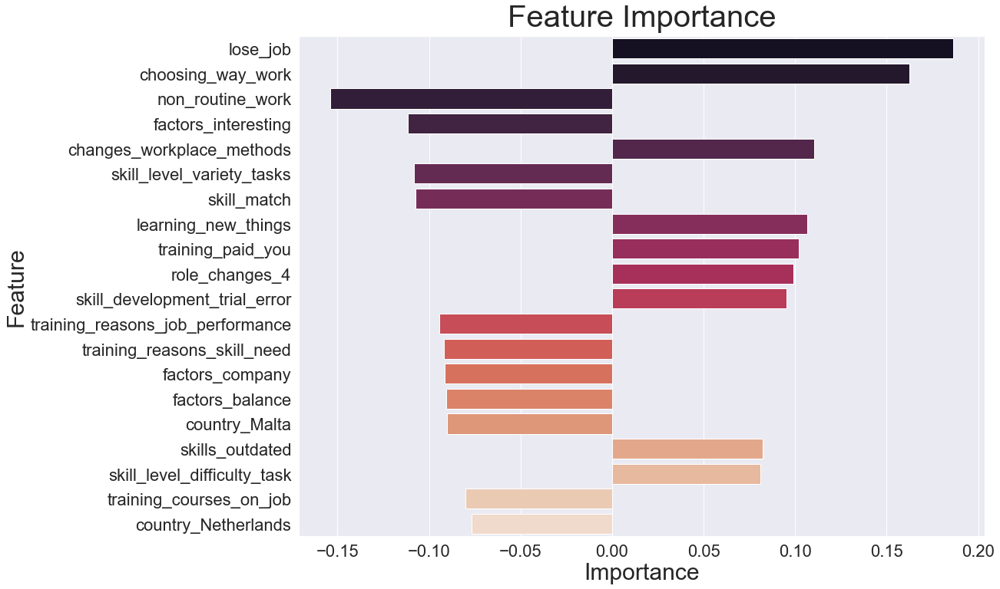

In [59]:
#plotting the coeffiecients
sns.set(font_scale = 2)
fig, ax = plt.subplots()

fig.set_size_inches(16, 12)
sns.barplot(x = 'coef', y = 'feature', data=coef_df_grid[:20], orient='h', palette = 'rocket', saturation=0.7)  
ax.set_title("Feature Importance", fontsize=40, y=1.01)
ax.set_xlabel('Importance', fontsize = 30)
ax.set_ylabel('Feature', fontsize = 30)


In [60]:
#print the ROC-AUC score
roc_auc_score(y_test, yhat_pp, multi_class='ovo')

0.7059736007817521

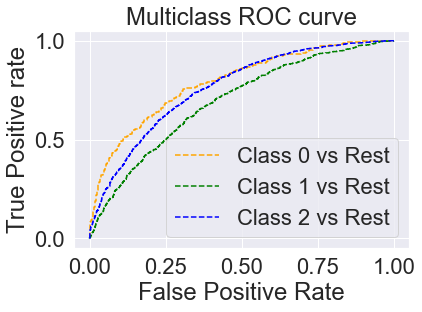

In [61]:
# plot the roc curve for the three different classes
fpr = {}
tpr = {}
thresh ={}

n_class = 3

for i in range(n_class):    
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test, yhat_pp[:,i], pos_label=i)
    
# plotting    
plt.plot(fpr[0], tpr[0], linestyle='--',color='orange', label='Class 0 vs Rest')
plt.plot(fpr[1], tpr[1], linestyle='--',color='green', label='Class 1 vs Rest')
plt.plot(fpr[2], tpr[2], linestyle='--',color='blue', label='Class 2 vs Rest')
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='best')
plt.savefig('Multiclass ROC',dpi=300);    

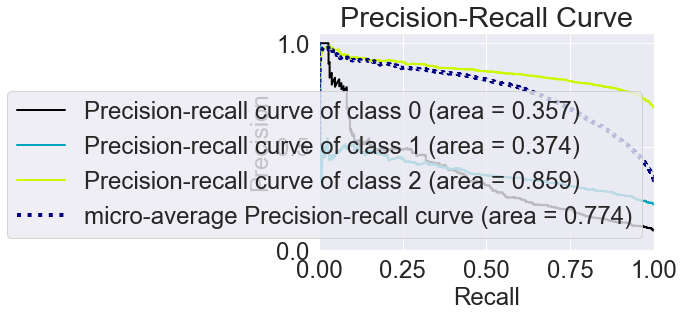

In [62]:
#plot the precision recall curve
skplt.metrics.plot_precision_recall(y_test, yhat_pp)
plt.show()

### Conclusion on Regressions

All the Logistic Regressions performed similarly with an accuracy score of 0.71, with ridge regression performing better in terms of the AUC-ROC score (0.7069) and the grid searched regression (also ridge) performing better for the precision-recall score (0.774). 

Here AUC represents the degree of separability. It tells how much the model is capable of distinguishing between classes, with 0.5 being no better than chance.

Looking at the AUC curve for the grid searched regression, each class performs similarly to the others - therefore the model is no better at distinguishing between a specific class and the other classes. 

Precision refers to the fraction of positive predictions that actually belong to the positive class, whilst recall refers to the fraction of positive predictions out of all the positive instances in the dataset.

Our model performs better than average for precision-recall, but specifically it performs much better for class 2 (0.859) compared to class 1 and 0 (0.374 and 0.357 respectively), where it performs worse than chance. Here class 2 refers to very satisfied in a job.

Looking at feature importance, there does not look like there are overly similar factors that impact the model. The most important feature in whether you enjoy your job is how likely you are to lose it in the next year, as well as choosing the way you work, having non-routine work, choosing a role because it's interesting and what changes have been made to your workplace in terms of methods. 

Can we now improve on our model by using both boosting and bagging techniques? Let's find out. 



## Decision Tree Classifier with Grid Search

Firstly, we'll use a Decision Tree. 

Decision trees are a great first port of call as their hierarchical structure lets them learn signals from all classes and therefore they often perform well on imbalanced datasets.

In [63]:
DeTree = DecisionTreeClassifier()

In [64]:
#identify the parameters to use in a Grid Search
parameters = {'criterion': ['gini','entropy'],
                      'max_depth': list(range(1, 11))+[None],
                    'max_features': [None, 1, 2, 3],
                    'min_samples_split': [2, 3, 4, 5],
                    'ccp_alpha': [0, 0.001, 0.005, 0.01]}

In [65]:
#define the Grid Search
DeTree_gridsearch = GridSearchCV(DeTree,
                              parameters,
                              n_jobs=2, 
                              cv=5, 
                              verbose=1)

DeTree_gridsearch.fit(X_train, y_train)

Fitting 5 folds for each of 1408 candidates, totalling 7040 fits


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_jobs=2,
             param_grid={'ccp_alpha': [0, 0.001, 0.005, 0.01],
                         'criterion': ['gini', 'entropy'],
                         'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, None],
                         'max_features': [None, 1, 2, 3],
                         'min_samples_split': [2, 3, 4, 5]},
             verbose=1)

In [66]:
# Check the evaluation scores
print(DeTree_gridsearch.score(X_train, y_train))
print(cross_val_score(DeTree_gridsearch, X_train, y_train, cv=5).mean())
print(DeTree_gridsearch.score(X_test, y_test))

0.6946824224519941
Fitting 5 folds for each of 1408 candidates, totalling 7040 fits
Fitting 5 folds for each of 1408 candidates, totalling 7040 fits
Fitting 5 folds for each of 1408 candidates, totalling 7040 fits
Fitting 5 folds for each of 1408 candidates, totalling 7040 fits
Fitting 5 folds for each of 1408 candidates, totalling 7040 fits
0.690768094534712
0.6937389249852333


In [67]:
DeTree_gridsearch.best_score_

0.6946824224519942

In [68]:
DeTree_gridsearch.best_estimator_

DecisionTreeClassifier(ccp_alpha=0, max_depth=2)

In [69]:
DeTree_gridsearch.best_params_

{'ccp_alpha': 0,
 'criterion': 'gini',
 'max_depth': 2,
 'max_features': None,
 'min_samples_split': 2}

In [70]:
from six import StringIO
import graphviz
from sklearn.tree import export_graphviz
from pydotplus import graph_from_dot_data

In [71]:
#display the image of the best Decision Tree
def build_tree_image(DeTree_gridsearch, feature_names=None):
    dot_data = export_graphviz(DeTree_gridsearch,
                filled=True,
                rounded=True,
                special_characters=True,
                feature_names=feature_names
                )
    graph = graphviz.Source(dot_data) 
    return graph

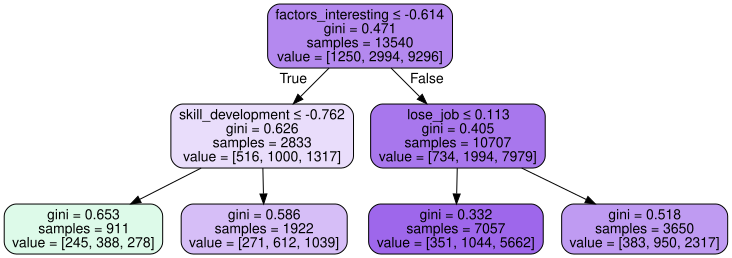

In [72]:
build_tree_image(DeTree_gridsearch.best_estimator_, feature_names=X_train.columns)

In [73]:
#Ideal model fitted
dt_classifier = DecisionTreeClassifier(criterion='gini',
                                    max_depth=2, 
                                    max_features=None,
                                       min_samples_split=2,
                                      ccp_alpha=0)
dt_classifier.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0, max_depth=2)

In [74]:
print(dt_classifier.score(X_train, y_train))
print(cross_val_score(dt_classifier, X_train, y_train, cv=5).mean())
print(dt_classifier.score(X_test, y_test))

0.6946824224519941
0.6946824224519942
0.6937389249852333


In [75]:
# Check the misclassified items
pred_list_dt_classifier = dt_classifier.predict_proba(X_train)
pred_result_dt_classifier = pd.DataFrame(pred_list_dt_classifier, y_train)
pred_result_dt_classifier['actual'] = dt_classifier.predict(X_train)
pred_result_dt_classifier.reset_index(inplace=True)

In [76]:
misclassified_dt_classifier = pred_result_dt_classifier[pred_result_dt_classifier.job_satisfaction != pred_result_dt_classifier.actual]


In [77]:
misclassified_dt_classifier = misclassified_dt_classifier.reindex(columns=['job_satisfaction', 'actual', 0, 1])
misclassified_dt_classifier['difference'] = (misclassified_dt_classifier[0] - misclassified_dt_classifier[1]).round(2)
misclassified_dt_classifier[:20]

,job_satisfaction,actual,0,1,difference
1,1,2,0.140999,0.318418,-0.18
4,1,2,0.049738,0.147938,-0.10
6,1,2,0.104932,0.260274,-0.16
9,0,2,0.104932,0.260274,-0.16
10,0,1,0.268935,0.425906,-0.16
12,1,2,0.049738,0.147938,-0.10
19,1,2,0.140999,0.318418,-0.18
24,1,2,0.049738,0.147938,-0.10
27,0,2,0.104932,0.260274,-0.16
32,0,2,0.049738,0.147938,-0.10


In [78]:
# Check the feature importance table
dt_classifier_result = pd.DataFrame(dt_classifier.feature_importances_,
             columns=['importance'],
             index=X.columns,
             ).sort_values(by='importance', ascending=False
                           ).reset_index()
dt_classifier_result.rename(columns={'index': 'feature'}, inplace=True)
dt_classifier_result[:10]

,feature,importance
0,factors_interesting,0.630354
1,lose_job,0.248147
2,skill_development,0.121499
3,country_Slovakia,0.000000
4,country_Latvia,0.000000
5,country_Lithuania,0.000000
6,country_Luxembourg,0.000000
7,country_Malta,0.000000
8,country_Netherlands,0.000000
9,country_Poland,0.000000


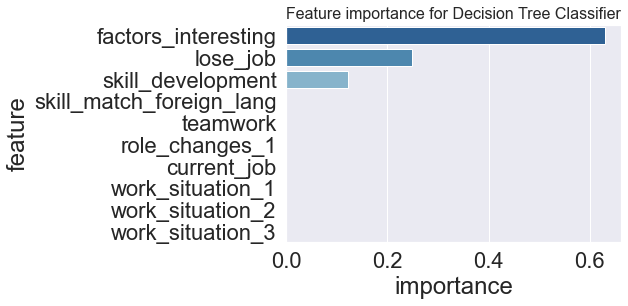

In [79]:
# Plot the feature importance table
dt_classifier_model_result = pd.concat([dt_classifier_result.sort_values(by='importance', ascending=False).head(10)])
sns.barplot(y = dt_classifier_model_result.feature, x = dt_classifier_model_result.importance, palette = "RdBu_r")
plt.title("Feature importance for Decision Tree Classifier", loc = 'left', fontsize = 16)
plt.show()

In [81]:
# Check precision and recall scores
yhat_dt_classifier = dt_classifier.predict(X_test)
yhat_pp_dt_classifier = dt_classifier.predict_proba(X_test)
print(classification_report(y_test, yhat_dt_classifier))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       313
           1       0.42      0.14      0.21       749
           2       0.72      0.97      0.82      2324

    accuracy                           0.69      3386
   macro avg       0.38      0.37      0.34      3386
weighted avg       0.58      0.69      0.61      3386



In [82]:
roc_auc_score(y_test, yhat_pp_dt_classifier, multi_class='ovo')

0.617800208505287

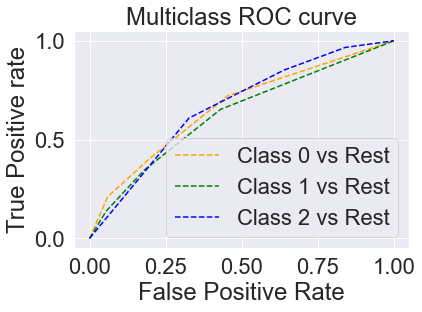

In [83]:
# roc curve for classes
fpr = {}
tpr = {}
thresh ={}

n_class = 3

for i in range(n_class):    
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test, yhat_pp_dt_classifier[:,i], pos_label=i)
    
# plotting    
plt.plot(fpr[0], tpr[0], linestyle='--',color='orange', label='Class 0 vs Rest')
plt.plot(fpr[1], tpr[1], linestyle='--',color='green', label='Class 1 vs Rest')
plt.plot(fpr[2], tpr[2], linestyle='--',color='blue', label='Class 2 vs Rest')
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='best')
plt.savefig('Multiclass ROC',dpi=300); 

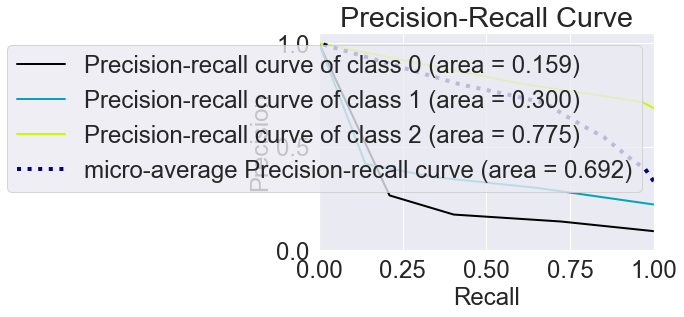

In [85]:
skplt.metrics.plot_precision_recall(y_test, yhat_pp_dt_classifier)
plt.show()

## Random Forest Classifier with Grid Search

Next we'll try a Random Forest Classifier. As a bagging classifier, Random Forest first selects random samples of the training data with replacement, meaning that a given sample may contain zero, one, or more than one copy of examples in the training data. 

One weak learner model is then fit on each data sample. Typically, decision tree models that do not use pruning (and may therefore overfit the data) are used as weak learners. Finally, the predictions from all of the fit weak learners are combined to make a single prediction. In this way, although our Decision Tree model did not look as though it was over fitting, Random Forest can still help with this. 

Therefore Random Forest generalises better by reducing the variance because the generalisation error reaches a limit with an increasing number of trees grown. In this way, it is less affected by noise and outliers. 

In [86]:
param_grid = { 
    'n_estimators': [10,15,20, 50,100, 200, 500],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [4,5,6,7,8],
    'criterion' :['gini', 'entropy']
}

In [87]:
CV_rfc = GridSearchCV(RandomForestClassifier(), param_grid, verbose=1)

CV_rfc.fit(X_train, y_train)

Fitting 5 folds for each of 210 candidates, totalling 1050 fits


GridSearchCV(estimator=RandomForestClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [4, 5, 6, 7, 8],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': [10, 15, 20, 50, 100, 200, 500]},
             verbose=1)

In [88]:
print(CV_rfc.score(X_train, y_train))
print(cross_val_score(CV_rfc, X_train, y_train, cv=5).mean())
print(CV_rfc.score(X_test, y_test))

0.7375184638109306
Fitting 5 folds for each of 210 candidates, totalling 1050 fits
Fitting 5 folds for each of 210 candidates, totalling 1050 fits
Fitting 5 folds for each of 210 candidates, totalling 1050 fits
Fitting 5 folds for each of 210 candidates, totalling 1050 fits
Fitting 5 folds for each of 210 candidates, totalling 1050 fits
0.696824224519941
0.6990549320732428


In [89]:
CV_rfc.best_params_

{'criterion': 'entropy',
 'max_depth': 8,
 'max_features': 'auto',
 'n_estimators': 100}

In [90]:
#Ideal model fitted
CV_rfc_ideal = RandomForestClassifier(criterion='entropy',
                                    max_depth=8, 
                                    max_features= 'auto',
                                    n_estimators=100)
CV_rfc_ideal.fit(X_train, y_train)

RandomForestClassifier(criterion='entropy', max_depth=8)

In [91]:
print(CV_rfc_ideal.score(X_train, y_train))
print(cross_val_score(CV_rfc_ideal, X_train, y_train, cv=5).mean())
print(CV_rfc_ideal.score(X_test, y_test))

0.7375923190546528
0.6983751846381093
0.7005316007088009


In [92]:
yhat_CV_rfc_ideal = CV_rfc_ideal.predict(X_test)
yhat_pp_CV_rfc_ideal = CV_rfc_ideal.predict_proba(X_test)
print(classification_report(y_test, yhat_CV_rfc_ideal))

              precision    recall  f1-score   support

           0       0.57      0.07      0.13       313
           1       0.47      0.07      0.12       749
           2       0.71      0.99      0.83      2324

    accuracy                           0.70      3386
   macro avg       0.59      0.38      0.36      3386
weighted avg       0.64      0.70      0.61      3386



In [93]:
# Check the misclassified items
pred_list_CV_rfc_ideal = CV_rfc_ideal.predict_proba(X_train)
pred_result_CV_rfc_ideal = pd.DataFrame(pred_list_CV_rfc_ideal, y_train)
pred_result_CV_rfc_ideal['actual'] = CV_rfc_ideal.predict(X_train)
pred_result_CV_rfc_ideal.reset_index(inplace=True)

In [94]:
misclassified_CV_rfc_ideal = pred_result_CV_rfc_ideal[pred_result_CV_rfc_ideal.job_satisfaction != pred_result_CV_rfc_ideal.actual]

In [95]:
misclassified_CV_rfc_ideal = misclassified_CV_rfc_ideal.reindex(columns=['job_satisfaction', 'actual', 0, 1])
misclassified_CV_rfc_ideal['difference'] = (misclassified_CV_rfc_ideal[0] - misclassified_CV_rfc_ideal[1]).round(2)
misclassified_CV_rfc_ideal[:20]

,job_satisfaction,actual,0,1,difference
1,1,2,0.080257,0.429711,-0.35
4,1,2,0.162683,0.286872,-0.12
6,1,2,0.048481,0.191889,-0.14
9,0,2,0.098941,0.248371,-0.15
10,0,2,0.181978,0.301964,-0.12
12,1,2,0.050113,0.275162,-0.23
19,1,2,0.106614,0.351635,-0.25
24,1,2,0.055543,0.151795,-0.10
27,0,2,0.064715,0.155733,-0.09
33,1,2,0.066882,0.243528,-0.18


In [96]:
# Check the feature importance table
CV_rfc_ideal_result = pd.DataFrame(CV_rfc_ideal.feature_importances_,
             columns=['importance'],
             index=X.columns,
             ).sort_values(by='importance', ascending=False
                           ).reset_index()
CV_rfc_ideal_result.rename(columns={'index': 'feature'}, inplace=True)
CV_rfc_ideal_result[:10]

,feature,importance
0,factors_interesting,0.066155
1,lose_job,0.048446
2,factors_job_suited,0.036586
3,factors_company,0.033235
4,factors_balance,0.032731
5,skill_level_variety_tasks,0.032673
6,skill_development,0.029464
7,skill_level_learn_new,0.026790
8,skill_development_learnt_self,0.025101
9,skill_development_trial_error,0.024915


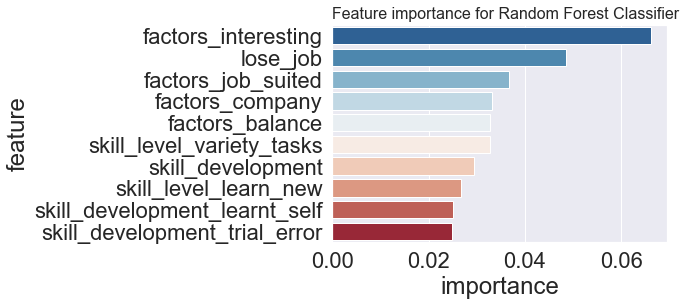

In [97]:
# Plot the feature importance table
CV_rfc_ideal_model_result = pd.concat([CV_rfc_ideal_result.sort_values(by='importance', ascending=False).head(10)])
sns.barplot(y = CV_rfc_ideal_model_result.feature, x = CV_rfc_ideal_model_result.importance, palette = "RdBu_r")
plt.title("Feature importance for Random Forest Classifier", loc = 'left', fontsize = 16)
plt.show()

In [98]:
roc_auc_score(y_test, yhat_pp_CV_rfc_ideal, multi_class='ovo')

0.698584405192992

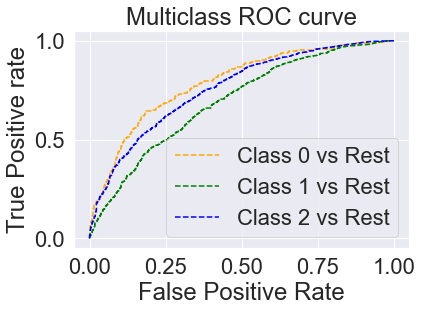

In [99]:
# roc curve for classes
fpr = {}
tpr = {}
thresh ={}

n_class = 3

for i in range(n_class):    
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test, yhat_pp_CV_rfc_ideal[:,i], pos_label=i)
    
# plotting    
plt.plot(fpr[0], tpr[0], linestyle='--',color='orange', label='Class 0 vs Rest')
plt.plot(fpr[1], tpr[1], linestyle='--',color='green', label='Class 1 vs Rest')
plt.plot(fpr[2], tpr[2], linestyle='--',color='blue', label='Class 2 vs Rest')
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='best')
plt.savefig('Multiclass ROC',dpi=300); 

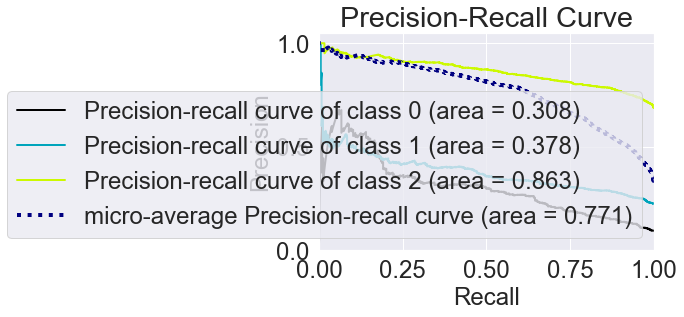

In [101]:
skplt.metrics.plot_precision_recall(y_test, yhat_pp_CV_rfc_ideal)
plt.show()

## Gradient Boost Classifier with Grid Search

The next approach I took was to see whether I could improve my score using Gradient Boosting, specifically the XGBoosting model. 

Gradient boosting is an approach where new models are created that predict the residuals or errors of prior models and then added together to make the final prediction. It is called gradient boosting because it uses a gradient descent algorithm to minimize the loss when adding new models.

In [102]:
parameters = {
    'min_child_weight': [1, 5],
        'gamma': [0.5, 1, 1.5,],
        'max_depth': [3, 4, 5],
        'learning_rate': [0.1, 0.01, 0.05]
    }

In [103]:
estimator = XGBClassifier(
    objective= 'binary:logistic',
)

In [104]:
xgb = GridSearchCV(
    estimator=estimator,
    param_grid=parameters,
    scoring = 'accuracy',
    n_jobs = -1,
    cv = 5,
    verbose=True
)

In [105]:
xgb.fit(X_train, y_train)

Fitting 5 folds for each of 54 candidates, totalling 270 fits


GridSearchCV(cv=5, estimator=XGBClassifier(), n_jobs=-1,
             param_grid={'gamma': [0.5, 1, 1.5],
                         'learning_rate': [0.1, 0.01, 0.05],
                         'max_depth': [3, 4, 5], 'min_child_weight': [1, 5]},
             scoring='accuracy', verbose=True)

In [106]:
print(xgb.score(X_train, y_train))
print(cross_val_score(xgb, X_train, y_train, cv=5).mean())
print(xgb.score(X_test, y_test))

0.7346381093057607
Fitting 5 folds for each of 54 candidates, totalling 270 fits
Fitting 5 folds for each of 54 candidates, totalling 270 fits
Fitting 5 folds for each of 54 candidates, totalling 270 fits
Fitting 5 folds for each of 54 candidates, totalling 270 fits
Fitting 5 folds for each of 54 candidates, totalling 270 fits
0.7138109305760708
0.7170702894270525


In [107]:
xgb.best_params_

{'gamma': 0.5, 'learning_rate': 0.1, 'max_depth': 3, 'min_child_weight': 1}

In [108]:
xgb.best_estimator_

XGBClassifier(gamma=0.5, objective='multi:softprob')

In [16]:
parametersgb = {'gamma': 0.5, 
                'learning_rate': 0.1, 
                'max_depth': 3, 
                'min_child_weight': 1
    }

In [17]:
xgboost = XGBClassifier(param_grid=parametersgb,
    scoring = 'accuracy',
    n_jobs = -1,
    cv = 5,
    verbose=True
)

In [36]:
xgboost.fit(X_train, y_train)

XGBClassifier(cv=5, n_jobs=-1, objective='multi:softprob',
              param_grid={'gamma': 0.5, 'learning_rate': 0.1, 'max_depth': 3,
                          'min_child_weight': 1},
              scoring='accuracy', verbose=True)

In [37]:
xgboost.score(X_train, y_train)

0.7346381093057607

In [38]:
yhat_pp_xgboost = xgboost.predict_proba(X_test)

In [39]:
xgboost_predictions = xgboost.predict(X_test)
 # print classification report
print(classification_report(y_test, xgboost_predictions))

              precision    recall  f1-score   support

           0       0.54      0.16      0.25       313
           1       0.49      0.20      0.28       749
           2       0.75      0.96      0.84      2324

    accuracy                           0.72      3386
   macro avg       0.59      0.44      0.46      3386
weighted avg       0.67      0.72      0.66      3386



In [40]:
# Check the feature importance table
xgboost_result = pd.DataFrame(xgboost.feature_importances_,
             columns=['importance'],
             index=X.columns,
             ).sort_values(by='importance', ascending=False
                           ).reset_index()
xgboost_result.rename(columns={'index': 'feature'}, inplace=True)
xgboost_result[:10]

,feature,importance
0,lose_job,0.066828
1,choosing_way_work,0.046489
2,skill_development,0.041646
3,skill_rating,0.036804
4,changes_workplace_supported,0.036320
5,factors_interesting,0.035835
6,skill_level_variety_tasks,0.034867
7,factors_company,0.033414
8,factors_pay,0.027603
9,learning_new_things,0.026150


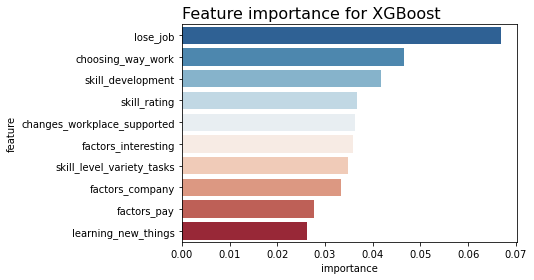

In [41]:
# Plot the feature importance table
xgboost_result = pd.concat([xgboost_result.sort_values(by='importance', ascending=False).head(10)])
sns.barplot(y = xgboost_result.feature, x = xgboost_result.importance, palette = "RdBu_r")
plt.title("Feature importance for XGBoost", loc = 'left', fontsize = 16)
plt.show()

In [116]:
roc_auc_score(y_test, yhat_pp_xgboost, multi_class='ovo')

0.7237673093579882

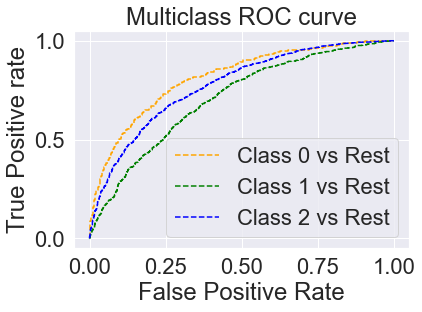

In [117]:
# roc curve for classes
fpr = {}
tpr = {}
thresh ={}

n_class = 3

for i in range(n_class):    
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test, yhat_pp_xgboost[:,i], pos_label=i)
    
# plotting    
plt.plot(fpr[0], tpr[0], linestyle='--',color='orange', label='Class 0 vs Rest')
plt.plot(fpr[1], tpr[1], linestyle='--',color='green', label='Class 1 vs Rest')
plt.plot(fpr[2], tpr[2], linestyle='--',color='blue', label='Class 2 vs Rest')
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='best')
plt.savefig('Multiclass ROC',dpi=300); 

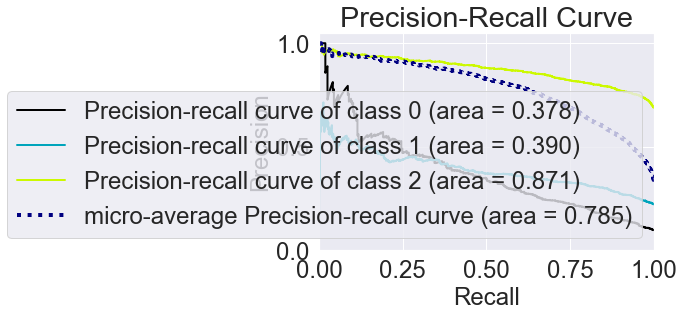

In [119]:
skplt.metrics.plot_precision_recall(y_test, yhat_pp_xgboost)
plt.show()

### Conclusion on boosting and bagging classifiers

Boosting and bagging classifiers definitely improved the performance of my model, with the XGBoost performing best and improving across the board in terms of measures, with an accuracy score of 0.72, a AUC score of 0.7237 and a precision recall score of 0.785.

Equally, the looking at feature importance - specifically the XGBoost - were in line with the previous results of the Grid Searched Logistic Regression.

Half of the top ten features were in both:
- whether you might lose your job in the next year
- choosing the way you work
- choosing a role because it's interesting
- whether the variety of tasks has increased since the start of a respondent's latest job
- whether the job frequently involves learning new things 

Here the features are what's known as the coefficients in the model. A coefficient represents the change in the mean value of y associated with a change in that coefficient, when all others are held constant.

## Principal Component Analysis

My final investigation looked at using Principal Component Analysis (PCA) to reduce the dimensionality of the dataset, increasing interpretability but at the same time minimizing information loss. PCA does this by creating new uncorrelated variables that successively maximize variance.

In [83]:
from sklearn.decomposition import PCA
#try 3 components to see what happens in the first instance
pca = PCA(n_components=80)
pca.fit(X_train)

PCA(n_components=80)

In [84]:
transform_pcs = pd.DataFrame(pca.transform(X_train), columns=[f'PC_{i+1}' for i in range(pca.n_components_)])
transform_pcs

,PC_1,PC_2,PC_3,PC_4,PC_5,PC_6,PC_7,PC_8,PC_9,PC_10,...,PC_71,PC_72,PC_73,PC_74,PC_75,PC_76,PC_77,PC_78,PC_79,PC_80
0,-3.158150,-1.461192,-1.600554,2.200069,-1.266274,-0.276047,0.843696,-2.966380,2.579255,-1.427774,...,0.907204,0.604163,0.481926,0.536021,-0.064791,-0.910262,-1.048394,-0.903532,-0.776185,-1.056959
1,0.892829,6.966264,-2.809485,-2.031359,2.246030,0.417981,1.181758,-2.667335,1.073514,-1.267678,...,0.583406,-1.554332,-1.198470,0.628967,-0.266677,0.199968,1.107542,0.237715,-0.947319,-0.126283
2,-2.161458,0.312471,-0.526858,-3.969919,-2.554656,-0.966771,1.306323,0.894481,1.444907,-0.517389,...,0.335269,-0.510731,1.639491,-0.605523,-0.752935,1.970919,0.124506,-3.215799,2.400269,-1.338432
3,5.116998,-3.386041,2.476813,4.112625,1.449906,-4.996062,0.494403,-0.399706,1.482743,-0.654602,...,3.364856,-2.602614,-0.414383,-2.808360,-1.091393,-1.272806,1.609362,-0.452269,-0.287404,-0.310396
4,-2.879728,-0.163218,2.977592,3.842117,-2.348247,-1.168057,1.703601,-0.444440,-1.348049,-0.203640,...,0.038388,1.027510,-0.304994,0.403324,1.978120,-1.159849,-1.470697,-0.261664,0.281237,-1.310003
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13535,5.582263,-0.049994,-2.627487,-0.440829,-0.830938,-1.661521,-2.862895,0.345069,-1.878319,-1.570696,...,0.688229,0.086405,-0.127589,0.813660,-0.611824,-0.171933,-0.165279,-0.440351,-0.758908,0.075692
13536,-1.361436,0.667788,2.962094,0.357582,1.739132,1.770175,0.091369,-3.284194,0.537089,-1.774315,...,0.563026,-0.688296,0.066989,-0.352769,0.121302,-0.522911,-0.039961,-0.781083,-0.155403,0.162071
13537,-1.991050,2.236591,-1.280413,1.034549,1.550143,0.519453,3.531117,0.207202,-0.190607,0.423503,...,-0.240809,0.180534,-0.233418,-0.798832,0.756963,0.257304,0.214397,0.851250,-0.041637,-0.696489
13538,3.312447,-5.136540,-2.805778,0.095162,0.242915,-1.222344,2.486862,-0.770691,-1.635354,-1.765245,...,-0.258593,0.804949,-0.925352,0.802521,-0.551134,-0.532879,0.034626,-0.466351,1.091997,0.580369


In [85]:
transform_pcs.var()

PC_1     11.100704
PC_2      6.753692
PC_3      4.440145
PC_4      3.457416
PC_5      3.214784
           ...    
PC_76     0.913440
PC_77     0.899906
PC_78     0.879313
PC_79     0.871616
PC_80     0.861929
Length: 80, dtype: float64

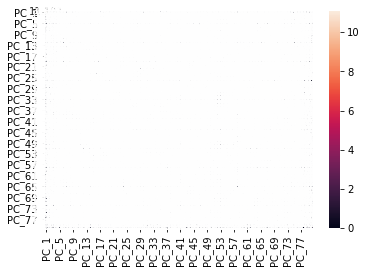

In [86]:
sns.heatmap(transform_pcs.cov(), annot=True, fmt='.3f')
plt.show()

In [106]:
from scikitplot.decomposition import plot_pca_component_variance

No handles with labels found to put in legend.


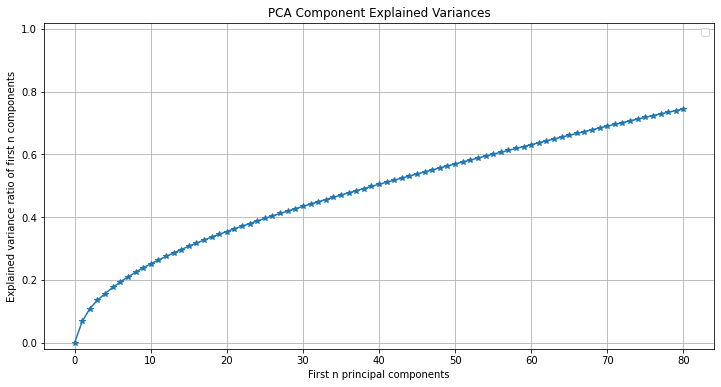

In [89]:
plot_pca_component_variance(pca, target_explained_variance=0.75, figsize=(12, 6))
plt.show()

In [107]:
from scikitplot.decomposition import plot_pca_2d_projection

In [108]:
plot_pca_2d_projection(pca, X_train, X_train.index, 
                       biplot=True,  
                       feature_labels=X_train.columns.to_list(), 
                       figsize=(12, 6))
plt.legend(loc=[1.1, 0], fontsize=8, ncol=3)
plt.show()

In [90]:
PCA(n_components=71)

PCA(n_components=71)

In [91]:
model = LogisticRegression()

In [92]:
model.fit(pca.fit_transform(X_train), y_train)
print(model.score(pca.fit_transform(X_train), y_train))
print(cross_val_score(model, pca.fit_transform(X_train), y_train, cv=5).mean())

model.coef_

0.6904726735598228
0.70288035450517


array([[ 8.04909535e-02,  5.51835860e-02,  1.56589296e-01,
         1.54784366e-02, -6.08479142e-02,  6.62196989e-02,
        -1.05831226e-01, -1.25104361e-04, -9.18117702e-02,
         1.12518321e-01,  2.30712120e-02,  4.77036604e-02,
        -5.54896645e-02, -4.76564848e-02, -4.58188872e-02,
        -1.75162715e-02, -3.17034841e-02,  5.76369315e-02,
         6.86578476e-02, -5.41158964e-02, -2.90436996e-02,
        -1.29020406e-01, -2.79788536e-02, -3.12583825e-03,
         6.28697747e-02,  1.93976392e-02,  8.37187444e-02,
         1.34112715e-02, -1.04030157e-01, -1.00168375e-02,
         9.25961020e-02, -3.27276553e-02, -4.85619493e-03,
         4.81579434e-02,  5.57412833e-03, -2.84281299e-02,
        -5.58685320e-02,  4.43049663e-03,  1.06633419e-01,
         2.98011188e-02, -1.72257820e-02,  7.33763803e-03,
         3.19085494e-03,  1.95153917e-02, -2.39326866e-02,
         7.72294048e-02, -3.89440243e-02, -3.33058011e-02,
        -3.81342360e-02,  6.57818830e-03,  8.00327489e-0

In [93]:
pca.explained_variance_

array([11.10070362,  6.75369157,  4.44014443,  3.45741444,  3.21478227,
        2.87804338,  2.66481824,  2.45207639,  2.34925556,  2.05773319,
        1.98122939,  1.92745679,  1.83903343,  1.79486499,  1.74574621,
        1.64300705,  1.61506118,  1.54732776,  1.49989354,  1.45293111,
        1.40994714,  1.40459806,  1.37805656,  1.3622839 ,  1.33993086,
        1.29742103,  1.27801077,  1.25925418,  1.24469261,  1.23705141,
        1.22631176,  1.19895461,  1.18136177,  1.17333129,  1.16805665,
        1.15565013,  1.15045205,  1.12834131,  1.1211727 ,  1.11127332,
        1.10593579,  1.09140321,  1.08533391,  1.08405343,  1.07662214,
        1.07108939,  1.06575618,  1.06044475,  1.04738487,  1.04469959,
        1.03625775,  1.03317001,  1.02831114,  1.02634913,  1.02085533,
        1.01340916,  1.00930277,  1.00743592,  1.00223757,  0.99960181,
        0.99355166,  0.99239967,  0.98832624,  0.98292578,  0.97764104,
        0.97377917,  0.9691648 ,  0.95936483,  0.9509458 ,  0.94

In [94]:
pca.explained_variance_ratio_

array([0.06727202, 0.04092844, 0.02690798, 0.02095248, 0.01948209,
       0.0174414 , 0.01614922, 0.01485997, 0.01423686, 0.01247019,
       0.01200656, 0.01168069, 0.01114483, 0.01087717, 0.0105795 ,
       0.00995688, 0.00978753, 0.00937705, 0.00908959, 0.00880499,
       0.0085445 , 0.00851209, 0.00835124, 0.00825566, 0.00812019,
       0.00786258, 0.00774495, 0.00763128, 0.00754303, 0.00749673,
       0.00743164, 0.00726585, 0.00715924, 0.00711057, 0.00707861,
       0.00700342, 0.00697192, 0.00683793, 0.00679448, 0.00673449,
       0.00670215, 0.00661408, 0.0065773 , 0.00656954, 0.0065245 ,
       0.00649097, 0.00645865, 0.00642646, 0.00634732, 0.00633105,
       0.00627989, 0.00626117, 0.00623173, 0.00621984, 0.00618655,
       0.00614142, 0.00611653, 0.00610522, 0.00607372, 0.00605775,
       0.00602108, 0.0060141 , 0.00598941, 0.00595669, 0.00592466,
       0.00590126, 0.00587329, 0.0058139 , 0.00576288, 0.00574933,
       0.00567522, 0.00566488, 0.00561281, 0.00556343, 0.00554

Using PCA did not reduce the dimensionality of the data by much or improve the cross validated score of the Logistic Regression. This suggests that there is little redundancy in the dataset and each feature is quite standalone in terms of what it predicts. 

## Conclusion for Hypothesis 1

Overall, the findings from these models allows me to accept my hypothesis that it's possible to predict better than baseline whether someone is going to enjoy their job, and offers me a number of features that affect this prediction the most. 

# Hypothesis 2 - Factors related to skills mismatch can predict whether an individual is likely to enjoy their job

Our second hypothesis asks whether we can predict better job satisfaction than baseline based on factors related to a skills mismatch.

Here we'll use our small dataset gathered from our EDA which specifically looks at a mismatch between skills, job role and qualification and determine whether that has any bearing on our accuracy. 

In [45]:
#load the data
data_small = pd.read_csv("data_small.csv", index_col=[0])

In [46]:
data_small.shape

(15560, 17)

In [47]:
#check to see whether it's correct
data_small.head()

,qual_level,qual_needed_have,job_satisfaction,qual_needed_do,qual_diff_have,skill_match,match,qual_diff,skill_match_technical,skill_match_communication,skill_match_teamwork,skill_match_foreign_lang,skill_match_customer_handling,skill_match_problem_solving,skill_match_learning,skill_match_planning_organisation,skill_rating
ID,,,,,,,,,,,,,,,,,
AT_250016,6,7,9,7,-1,2,1,-1,4.0,8.0,10.0,10.0,7.0,5.0,7.0,5.0,70
AT_250017,7,7,5,4,3,3,0,0,9.0,7.0,11.0,11.0,8.0,11.0,11.0,6.0,50
AT_250036,6,4,8,4,2,1,0,2,5.0,8.0,8.0,10.0,7.0,6.0,6.0,8.0,90
AT_250039,6,6,8,6,0,2,0,0,6.0,9.0,10.0,6.0,10.0,9.0,9.0,9.0,70
AT_250051,7,7,8,7,0,2,0,0,5.0,5.0,5.0,4.0,5.0,5.0,5.0,5.0,80


In [48]:
#as we are using a different dataset, we'll have fewer rows 
#and therefore we'll need to change the elements in job satisfaction accordingly
#so there are three categories. 
#We'll do this in the same way as above.
data_small.job_satisfaction.describe()

count    15560.000000
mean         6.993573
std          2.178419
min          0.000000
25%          6.000000
50%          8.000000
75%          8.000000
max         10.000000
Name: job_satisfaction, dtype: float64

In [49]:
data_small.job_satisfaction.median()

8.0

In [50]:
#change job categories into three
data_small.loc[data_small['job_satisfaction'] == 0, 'job_satisfaction'] = 0
data_small.loc[data_small['job_satisfaction'] == 1, 'job_satisfaction'] = 0
data_small.loc[data_small['job_satisfaction'] == 2, 'job_satisfaction'] = 0
data_small.loc[data_small['job_satisfaction'] == 3, 'job_satisfaction'] = 0
data_small.loc[data_small['job_satisfaction'] == 4, 'job_satisfaction'] = 1
data_small.loc[data_small['job_satisfaction'] == 5, 'job_satisfaction'] = 1
data_small.loc[data_small['job_satisfaction'] == 6, 'job_satisfaction'] = 1
data_small.loc[data_small['job_satisfaction'] == 7, 'job_satisfaction'] = 2
data_small.loc[data_small['job_satisfaction'] == 8, 'job_satisfaction'] = 2
data_small.loc[data_small['job_satisfaction'] == 9, 'job_satisfaction'] = 2
data_small.loc[data_small['job_satisfaction'] == 10, 'job_satisfaction'] = 2

In [51]:
#and set the target variable
y2 = data_small['job_satisfaction']

In [52]:
y2.shape

(15560,)

In [53]:
y2.value_counts(normalize=True)

2    0.695116
1    0.215488
0    0.089396
Name: job_satisfaction, dtype: float64

In [54]:
#set the features variables which will also be taken from the new dataframe
X2 = data_small[['qual_level', 'qual_needed_have', 
                          'qual_needed_do', 'qual_diff_have', 
                                        'skill_match', 'match', 'qual_diff',
                        'skill_match_technical', 'skill_match_communication', 
                                        'skill_match_teamwork', 'skill_match_foreign_lang', 
                                       'skill_match_customer_handling', 'skill_match_problem_solving',
                           'skill_match_learning', 'skill_match_planning_organisation']]

In [55]:
X2.shape

(15560, 15)

## Logistic Regression with no penalties

In [56]:
# define the training and test set
X2_train, X2_test, y2_train, y2_test = train_test_split (X2, y2, stratify=y2, test_size = 0.2, random_state=42)

In [57]:
#scale our data
scaler = StandardScaler()

X2_train = scaler.fit_transform(X2_train)
X2_test = scaler.transform(X2_test)

X2_train = pd.DataFrame(X2_train, columns=X2.columns)
X2_test = pd.DataFrame(X2_test, columns=X2.columns)

In [172]:
#logreg2 none

In [173]:
logreg2_none = LogisticRegression(penalty='none')


In [174]:
logreg2_none.fit(X2_train, y2_train)

LogisticRegression(penalty='none')

In [175]:
print('Training score: ', logreg2_none.score(X2_train, y2_train))
print('Test score: ', logreg2_none.score(X2_test, y2_test))
print('CV score: ', (cross_val_score(logreg2_none, X2_train, y2_train)).mean())

Training score:  0.6954530848329049
Test score:  0.6963367609254498
CV score:  0.6954531827591603


In [176]:
yhat_logreg2_none = logreg2_none.predict(X2_test)
yhat_pp_logreg2_none = logreg2_none.predict_proba(X2_test)
print(classification_report(y2_test, yhat_logreg2_none))

              precision    recall  f1-score   support

           0       0.56      0.02      0.03       278
           1       0.44      0.01      0.01       671
           2       0.70      1.00      0.82      2163

    accuracy                           0.70      3112
   macro avg       0.57      0.34      0.29      3112
weighted avg       0.63      0.70      0.58      3112



In [177]:
roc_auc_score(y2_test, yhat_pp_logreg2_none, multi_class='ovo')

0.5973364527247508

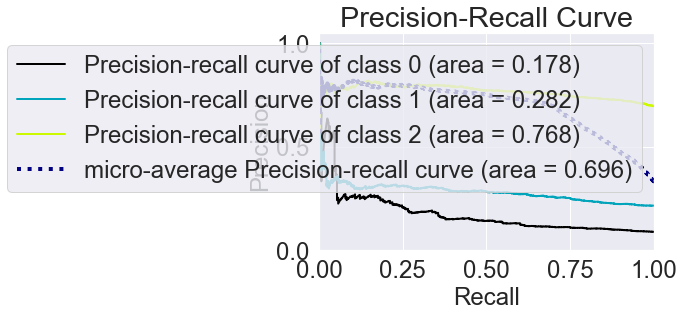

In [179]:
skplt.metrics.plot_precision_recall(y2_test, yhat_pp_logreg2_none)
plt.show()

## Logistic Regression with Lasso penalty

In [180]:
logreg2_l1 = LogisticRegression(penalty='l1', solver='liblinear')

In [181]:
logreg2_l1.fit(X2_train, y2_train)

LogisticRegression(penalty='l1', solver='liblinear')

In [182]:
print('Training score: ', logreg2_l1.score(X2_train, y2_train))
print('Test score: ', logreg2_l1.score(X2_test, y2_test))
print('CV score: ', (cross_val_score(logreg2_l1, X2_train, y2_train)).mean())

Training score:  0.6958547557840618
Test score:  0.6960154241645244
CV score:  0.6955334072327881


In [183]:
yhat_logreg2_l1 = logreg2_l1.predict(X2_test)
yhat_pp_logreg2_l1 = logreg2_l1.predict_proba(X2_test)
print(classification_report(y2_test, yhat_logreg2_l1))

              precision    recall  f1-score   support

           0       0.57      0.01      0.03       278
           1       0.38      0.01      0.01       671
           2       0.70      1.00      0.82      2163

    accuracy                           0.70      3112
   macro avg       0.55      0.34      0.29      3112
weighted avg       0.62      0.70      0.58      3112



In [184]:
roc_auc_score(y2_test, yhat_pp_logreg2_l1, multi_class='ovo')

0.5970548505231567

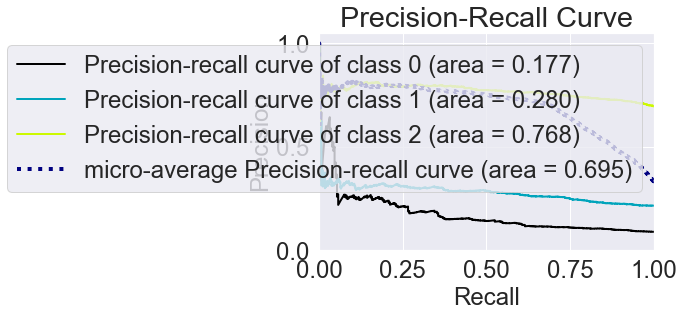

In [186]:
skplt.metrics.plot_precision_recall(y2_test, yhat_pp_logreg2_l1)
plt.show()

## Logistic Regression with Ridge penalty

In [187]:
logreg2_l2 = LogisticRegression(penalty='l2')

In [188]:
logreg2_l2.fit(X2_train, y2_train)

LogisticRegression()

In [189]:
print('Training score: ', logreg2_l2.score(X2_train, y2_train))
print('Test score: ', logreg2_l2.score(X2_test, y2_test))
print('CV score: ', (cross_val_score(logreg2_l2, X2_train, y2_train)).mean())

Training score:  0.6954530848329049
Test score:  0.6963367609254498
CV score:  0.6954531827591603


In [190]:
yhat_logreg2_l2 = logreg2_l2.predict(X2_test)
yhat_pp_logreg2_l2 = logreg2_l2.predict_proba(X2_test)
print(classification_report(y2_test, yhat_logreg2_l2))

              precision    recall  f1-score   support

           0       0.56      0.02      0.03       278
           1       0.44      0.01      0.01       671
           2       0.70      1.00      0.82      2163

    accuracy                           0.70      3112
   macro avg       0.57      0.34      0.29      3112
weighted avg       0.63      0.70      0.58      3112



In [191]:
roc_auc_score(y2_test, yhat_pp_logreg2_l2, multi_class='ovo')

0.5973284143592398

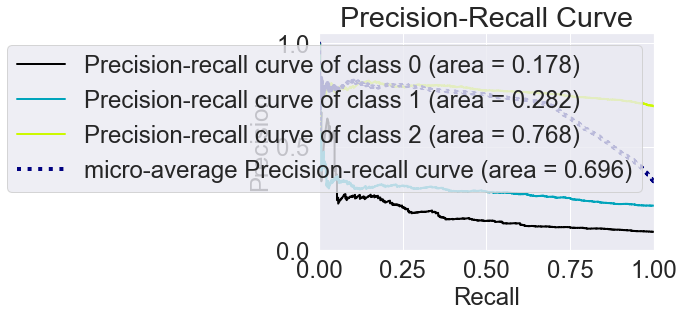

In [193]:
skplt.metrics.plot_precision_recall(y2_test, yhat_pp_logreg2_l2)
plt.show()

## Logistic Regression with Grid Search

In [194]:
logreg2 = LogisticRegression()

In [195]:
params = {'C': np.logspace(-5, 5, 15),
          'penalty': ['l1', 'l2', 'elasticnet']
          }

In [196]:
logreg2 = GridSearchCV(estimator=logreg2,
                  param_grid=params,
                  cv=5,
                  scoring='accuracy',
                  return_train_score=True,
                  n_jobs=2)

In [197]:
logreg2.fit(X2_train, y2_train)

GridSearchCV(cv=5, estimator=LogisticRegression(), n_jobs=2,
             param_grid={'C': array([1.00000000e-05, 5.17947468e-05, 2.68269580e-04, 1.38949549e-03,
       7.19685673e-03, 3.72759372e-02, 1.93069773e-01, 1.00000000e+00,
       5.17947468e+00, 2.68269580e+01, 1.38949549e+02, 7.19685673e+02,
       3.72759372e+03, 1.93069773e+04, 1.00000000e+05]),
                         'penalty': ['l1', 'l2', 'elasticnet']},
             return_train_score=True, scoring='accuracy')

In [198]:
print('Training score: ', logreg2.score(X2_train, y2_train))
print('Test score: ', logreg2.score(X2_test, y2_test))
print('CV score: ', (cross_val_score(logreg2, X2_train, y2_train)).mean())

Training score:  0.6954530848329049
Test score:  0.6963367609254498
CV score:  0.6952121866332345


In [199]:
print('Best score: ', logreg2.best_score_)
print('Mean cross validation score: ', cross_val_score(logreg2.best_estimator_, X2_train, y2_train, cv=5).mean())
print('Best parameters: ', logreg2.best_params_)
print('Best estimator: ', logreg2.best_estimator_)

Best score:  0.6954531827591603
Mean cross validation score:  0.6954531827591603
Best parameters:  {'C': 0.19306977288832497, 'penalty': 'l2'}
Best estimator:  LogisticRegression(C=0.19306977288832497)


In [201]:
yhat2 = logreg2.predict(X2_test)
yhat2_pp = logreg2.predict_proba(X2_test)
print(classification_report(y2_test, yhat2))

              precision    recall  f1-score   support

           0       0.56      0.02      0.03       278
           1       0.44      0.01      0.01       671
           2       0.70      1.00      0.82      2163

    accuracy                           0.70      3112
   macro avg       0.57      0.34      0.29      3112
weighted avg       0.63      0.70      0.58      3112



In [202]:
# Create a DataFrame to look at the coefficients
coef_df_grid2 = pd.DataFrame({'feature': X2.columns,
                        'coef': logreg2.best_estimator_.coef_[0],
                            'abs_coef': np.abs(logreg2.best_estimator_.coef_[0])})

In [203]:
coef_df_grid2 = coef_df_grid2.sort_values(by='abs_coef', ascending=False)

Text(0, 0.5, 'Feature')

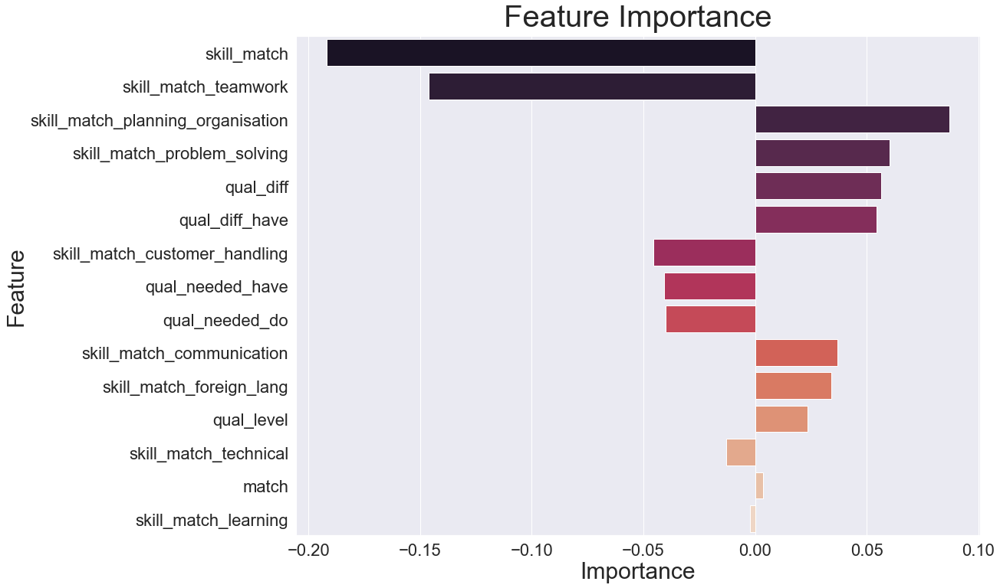

In [204]:
#sns.set_style('ticks')
sns.set(font_scale = 2)
fig, ax = plt.subplots()
# the size of A4 paper
fig.set_size_inches(16, 12)
sns.barplot(x = 'coef', y = 'feature', data=coef_df_grid2[:20], orient='h', palette = 'rocket', saturation=0.7)  
ax.set_title("Feature Importance", fontsize=40, y=1.01)
ax.set_xlabel('Importance', fontsize = 30)
ax.set_ylabel('Feature', fontsize = 30)

#fig.savefig('linreg_coef.png')

In [205]:
roc_auc_score(y2_test, yhat2_pp, multi_class='ovo')

0.59731075556553

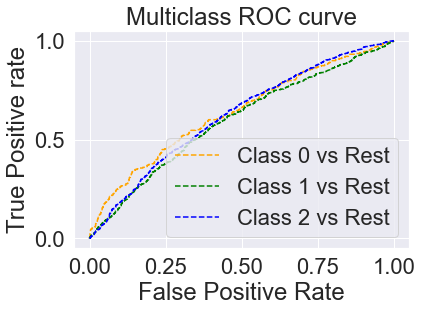

In [206]:
# roc curve for classes
fpr = {}
tpr = {}
thresh ={}

n_class = 3

for i in range(n_class):    
    fpr[i], tpr[i], thresh[i] = roc_curve(y2_test, yhat2_pp[:,i], pos_label=i)
    
# plotting    
plt.plot(fpr[0], tpr[0], linestyle='--',color='orange', label='Class 0 vs Rest')
plt.plot(fpr[1], tpr[1], linestyle='--',color='green', label='Class 1 vs Rest')
plt.plot(fpr[2], tpr[2], linestyle='--',color='blue', label='Class 2 vs Rest')
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='best')
plt.savefig('Multiclass ROC',dpi=300); 

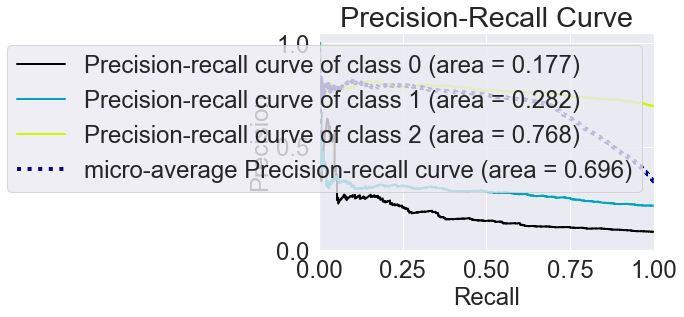

In [208]:
skplt.metrics.plot_precision_recall(y2_test, yhat2_pp)
plt.show()

### Conclusion on Regressions

This time, we could not say better than baseline using Logistic Regression that our model can predict whether or not factors relating to a skills mismatch influence job satisfaction. All our models had an accuracy score of 0.70 - with our baseline here being 0.695116 - and our best model overall was the Logistic Regression with no penalties with an AUC score of 0.597 and a precision recall score of 0.768.  

However, we can still inspect which features played a bigger role in influencing the score. According to the Grid Searched Logistic Regression, the top 2 features that negatively affected the outcome of the model were: 

- skills in relation to what is required to do the job
- team work skills in relation to what is required to do the job

and the top 3 features that positively affected the outcome of the model were:
- planning and organisation skills in relation to what is required to do the job
- problem solving skills in relation to what is required to do the job
- the difference between the qualifications you have for a job vs what is needed

## Decision Tree with Grid Search

We'll now see whether other modeling methods, including boosting and bagging, will be able to better predict job satisfaction based on a skills mismatch. 

Firstly, we'll use a Decision Tree. 

Decision trees are a great first port of call as their hierarchical structure lets them learn signals from all classes and therefore they often perform well on imbalanced datasets. 

In [209]:
DeTree_2 = DecisionTreeClassifier()

In [210]:
#identify the parameters to use in a Grid Search
parameters = {'criterion': ['gini','entropy'],
                      'max_depth': list(range(1, 11))+[None],
                    'max_features': [None, 1, 2, 3],
                    'min_samples_split': [2, 3, 4, 5],
                    'ccp_alpha': [0, 0.001, 0.005, 0.01]}

In [211]:
#define the Grid Search
DeTree_2_gridsearch = GridSearchCV(DeTree_2,
                              parameters,
                              n_jobs=2, 
                              cv=5, 
                              verbose=1)

DeTree_2_gridsearch.fit(X2_train, y2_train)

Fitting 5 folds for each of 1408 candidates, totalling 7040 fits


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_jobs=2,
             param_grid={'ccp_alpha': [0, 0.001, 0.005, 0.01],
                         'criterion': ['gini', 'entropy'],
                         'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, None],
                         'max_features': [None, 1, 2, 3],
                         'min_samples_split': [2, 3, 4, 5]},
             verbose=1)

In [212]:
# Check the evaluation scores
print(DeTree_2_gridsearch.score(X2_train, y2_train))
print(cross_val_score(DeTree_2_gridsearch, X2_train, y2_train, cv=5).mean())
print(DeTree_2_gridsearch.score(X2_test, y2_test))

0.6960154241645244
Fitting 5 folds for each of 1408 candidates, totalling 7040 fits
Fitting 5 folds for each of 1408 candidates, totalling 7040 fits
Fitting 5 folds for each of 1408 candidates, totalling 7040 fits
Fitting 5 folds for each of 1408 candidates, totalling 7040 fits
Fitting 5 folds for each of 1408 candidates, totalling 7040 fits
0.6948104511255144
0.6940874035989717


In [213]:
DeTree_2_gridsearch.best_score_

0.6955334072327881

In [214]:
DeTree_2_gridsearch.best_estimator_

DecisionTreeClassifier(ccp_alpha=0, criterion='entropy', max_depth=4,
                       max_features=2)

In [215]:
DeTree_2_gridsearch.best_params_

{'ccp_alpha': 0,
 'criterion': 'entropy',
 'max_depth': 4,
 'max_features': 2,
 'min_samples_split': 2}

In [216]:
from six import StringIO
import graphviz
from sklearn.tree import export_graphviz
from pydotplus import graph_from_dot_data

In [217]:
#display the image of the best Decision Tree
def build_tree_image(DeTree_2_gridsearch, feature_names=None):
    dot_data = export_graphviz(DeTree_2_gridsearch,
                filled=True,
                rounded=True,
                special_characters=True,
                feature_names=feature_names
                )
    graph = graphviz.Source(dot_data) 
    return graph

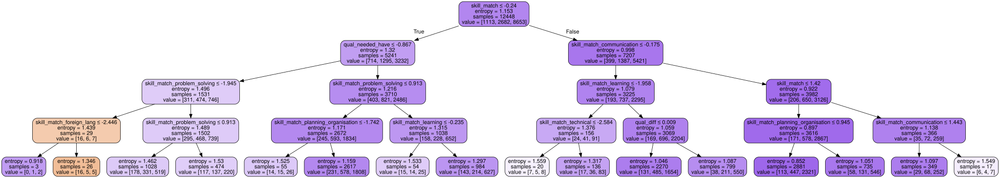

In [218]:
build_tree_image(DeTree_2_gridsearch.best_estimator_, feature_names=X2_train.columns)

In [224]:
#Ideal model fitted
dt_2_classifier = DecisionTreeClassifier(criterion='entropy',
                                    max_depth=4, 
                                    max_features=2,
                                       min_samples_split=2,
                                      ccp_alpha=0)
dt_2_classifier.fit(X2_train, y2_train)

DecisionTreeClassifier(ccp_alpha=0, criterion='entropy', max_depth=4,
                       max_features=2)

In [226]:
print(dt_2_classifier.score(X2_train, y2_train))
print(cross_val_score(dt_2_classifier, X2_train, y2_train, cv=5).mean())
print(dt_2_classifier.score(X2_test, y2_test))

0.6962564267352185
0.6949711259663
0.6950514138817481


In [227]:
# Check the precision and recall scores
yhat_dt_2_classifier = dt_2_classifier.predict(X2_test)
yhat_pp_dt_2_classifier = dt_2_classifier.predict_proba(X2_test)
print(classification_report(y2_test, yhat_dt_2_classifier))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       278
           1       0.31      0.01      0.02       671
           2       0.70      1.00      0.82      2163

    accuracy                           0.70      3112
   macro avg       0.34      0.34      0.28      3112
weighted avg       0.55      0.70      0.58      3112



In [228]:
# Check the misclassified items
pred_list_dt_2_classifier = dt_2_classifier.predict_proba(X2_train)
pred_result_dt_2_classifier = pd.DataFrame(pred_list_dt_2_classifier, y2_train)
pred_result_dt_2_classifier['actual'] = dt_2_classifier.predict(X2_train)
pred_result_dt_2_classifier.reset_index(inplace=True)

In [229]:
misclassified_dt_2_classifier = pred_result_dt_2_classifier[pred_result_dt_2_classifier.job_satisfaction != pred_result_dt_2_classifier.actual]


In [230]:
misclassified_dt_2_classifier = misclassified_dt_2_classifier.reindex(columns=['job_satisfaction', 'actual', 0, 1])
misclassified_dt_2_classifier['difference'] = (misclassified_dt_2_classifier[0] - misclassified_dt_2_classifier[1]).round(2)
misclassified_dt_2_classifier[:20]

,job_satisfaction,actual,0,1,difference
0,1,2,0.060965,0.187261,-0.13
4,0,2,0.120879,0.282967,-0.16
7,1,2,0.060965,0.187261,-0.13
11,0,2,0.200000,0.259406,-0.06
14,1,2,0.120879,0.282967,-0.16
18,1,2,0.072634,0.214233,-0.14
20,1,2,0.107868,0.204949,-0.10
23,0,2,0.200000,0.259406,-0.06
29,1,2,0.060965,0.187261,-0.13
30,0,2,0.120879,0.282967,-0.16


In [231]:
# Check the feature importance table
dt_2_classifier_result = pd.DataFrame(dt_2_classifier.feature_importances_,
             columns=['importance'],
             index=X2.columns,
             ).sort_values(by='importance', ascending=False
                           ).reset_index()
dt_2_classifier_result.rename(columns={'index': 'feature'}, inplace=True)
dt_2_classifier_result[:10]

,feature,importance
0,qual_needed_have,0.602131
1,skill_match_technical,0.140056
2,skill_match_teamwork,0.107130
3,qual_diff_have,0.045003
4,qual_needed_do,0.041105
5,skill_match_customer_handling,0.040903
6,skill_match_communication,0.023672
7,qual_level,0.000000
8,skill_match,0.000000
9,match,0.000000


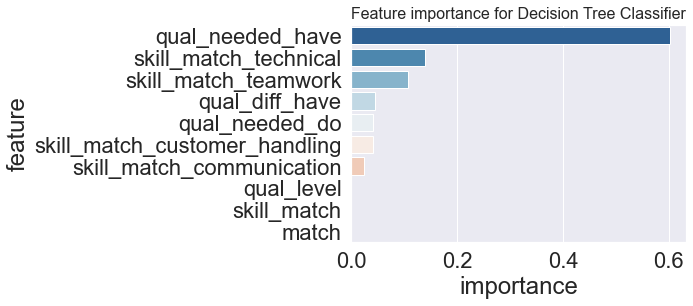

In [232]:
# Plot the feature importance table
dt_2_classifier_model_result = pd.concat([dt_2_classifier_result.sort_values(by='importance', ascending=False).head(10)])
sns.barplot(y = dt_2_classifier_model_result.feature, x = dt_2_classifier_model_result.importance, palette = "RdBu_r")
plt.title("Feature importance for Decision Tree Classifier", loc = 'left', fontsize = 16)
plt.show()

In [233]:
roc_auc_score(y2_test, yhat_pp_dt_2_classifier, multi_class='ovo')

0.5647339690707257

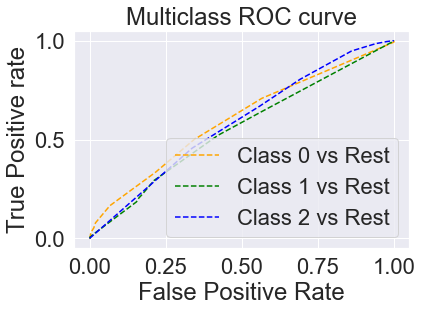

In [234]:
# roc curve for classes
fpr = {}
tpr = {}
thresh ={}

n_class = 3

for i in range(n_class):    
    fpr[i], tpr[i], thresh[i] = roc_curve(y2_test, yhat_pp_dt_2_classifier[:,i], pos_label=i)
    
# plotting    
plt.plot(fpr[0], tpr[0], linestyle='--',color='orange', label='Class 0 vs Rest')
plt.plot(fpr[1], tpr[1], linestyle='--',color='green', label='Class 1 vs Rest')
plt.plot(fpr[2], tpr[2], linestyle='--',color='blue', label='Class 2 vs Rest')
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='best')
plt.savefig('Multiclass ROC',dpi=300); 

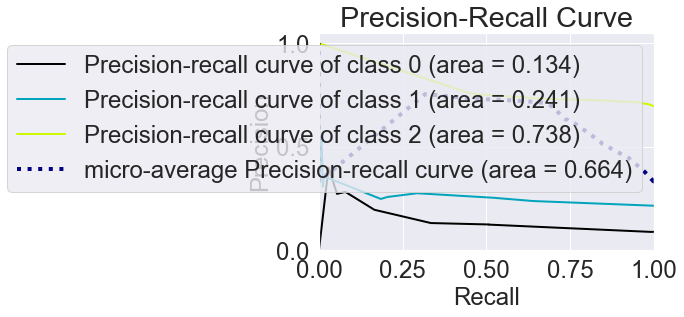

In [236]:
skplt.metrics.plot_precision_recall(y2_test, yhat_pp_dt_2_classifier)
plt.show()

The Decision Tree Classifier seems to perform even more poorly than the Logistic Regression models with an accuracy score of 0.69, and ROC score of 0.617 and a micro average PRC score 0.692.

Decision Trees are prone to over-fitting, however with a training score of 0.69 and a test score of 0.69 as well as the best parameter of max_depth of 2, this seems to not be the case in this model. 

## Random Forest Classifier with Grid Search

Next we'll try a Random Forest Classifier. As a bagging classifier, Random Forest first selects random samples of the training data with replacement, meaning that a given sample may contain zero, one, or more than one copy of examples in the training data. 

One weak learner model is then fit on each data sample. Typically, decision tree models that do not use pruning (and may therefore overfit the data) are used as weak learners. Finally, the predictions from all of the fit weak learners are combined to make a single prediction. In this way, although our Decision Tree model did not look as though it was over fitting, Random Forest can still help with this. 

Therefore Random Forest generalises better by reducing the variance because the generalisation error reaches a limit with an increasing number of trees grown. In this way, it is less affected by noise and outliers. 

In [238]:
param_grid = { 
    'n_estimators': [10,15, 20, 50, 100, 200, 500],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [4,5,6,7,8],
    'criterion' :['gini', 'entropy']
}

In [239]:
CV_rfc2 = GridSearchCV(RandomForestClassifier(), param_grid, verbose=1)

CV_rfc2.fit(X2_train, y2_train)

Fitting 5 folds for each of 210 candidates, totalling 1050 fits


GridSearchCV(estimator=RandomForestClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [4, 5, 6, 7, 8],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': [10, 15, 20, 50, 100, 200, 500]},
             verbose=1)

In [240]:
print(CV_rfc2.score(X2_train, y2_train))
print(cross_val_score(CV_rfc2, X2_train, y2_train, cv=5).mean())
print(CV_rfc2.score(X2_test, y2_test))

0.7084672236503856
Fitting 5 folds for each of 210 candidates, totalling 1050 fits
Fitting 5 folds for each of 210 candidates, totalling 1050 fits
Fitting 5 folds for each of 210 candidates, totalling 1050 fits
Fitting 5 folds for each of 210 candidates, totalling 1050 fits
Fitting 5 folds for each of 210 candidates, totalling 1050 fits
0.6951318008070853
0.6963367609254498


In [241]:
yhat_CV_rfc2 = CV_rfc2.predict(X2_test)
yhat_pp_CV_rfc2 = CV_rfc2.predict_proba(X2_test)
print(classification_report(y2_test, yhat_CV_rfc2))

              precision    recall  f1-score   support

           0       0.80      0.01      0.03       278
           1       0.38      0.01      0.02       671
           2       0.70      1.00      0.82      2163

    accuracy                           0.70      3112
   macro avg       0.63      0.34      0.29      3112
weighted avg       0.64      0.70      0.58      3112



In [242]:
CV_rfc2.best_params_

{'criterion': 'entropy',
 'max_depth': 8,
 'max_features': 'sqrt',
 'n_estimators': 50}

In [243]:
#Ideal model fitted
CV_rfc2_ideal = RandomForestClassifier(criterion='entropy',
                                    max_depth=8, 
                                    max_features= 'sqrt',
                                    n_estimators=50)
CV_rfc2_ideal.fit(X2_train, y2_train)

RandomForestClassifier(criterion='entropy', max_depth=8, max_features='sqrt',
                       n_estimators=50)

In [244]:
print(CV_rfc2_ideal.score(X2_train, y2_train))
print(cross_val_score(CV_rfc2_ideal, X2_train, y2_train, cv=5).mean())
print(CV_rfc2_ideal.score(X2_test, y2_test))

0.7112789203084833
0.6953728937445242
0.6979434447300771


In [245]:
yhat_CV_rfc2_ideal = CV_rfc2_ideal.predict(X2_test)
yhat_pp_CV_rfc2_ideal = CV_rfc2_ideal.predict_proba(X2_test)
print(classification_report(y2_test, yhat_CV_rfc2_ideal))

              precision    recall  f1-score   support

           0       0.62      0.03      0.05       278
           1       0.42      0.01      0.03       671
           2       0.70      1.00      0.82      2163

    accuracy                           0.70      3112
   macro avg       0.58      0.35      0.30      3112
weighted avg       0.63      0.70      0.58      3112



In [246]:
# Check the feature importance table
CV_rfc2_ideal_result = pd.DataFrame(CV_rfc2_ideal.feature_importances_,
             columns=['importance'],
             index=X2.columns,
             ).sort_values(by='importance', ascending=False
                           ).reset_index()
CV_rfc2_ideal_result.rename(columns={'index': 'feature'}, inplace=True)
CV_rfc2_ideal_result[:13]

,feature,importance
0,skill_match,0.124177
1,qual_diff_have,0.087331
2,skill_match_foreign_lang,0.080838
3,skill_match_planning_organisation,0.078775
4,skill_match_teamwork,0.073078
5,skill_match_technical,0.069236
6,skill_match_communication,0.068675
7,skill_match_learning,0.067283
8,skill_match_problem_solving,0.066810
9,qual_diff,0.064837


In [247]:
roc_auc_score(y2_test, yhat_pp_CV_rfc2_ideal, multi_class='ovo')

0.6090086559581726

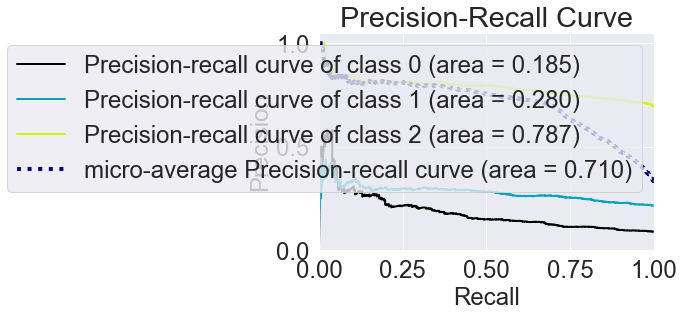

In [249]:
skplt.metrics.plot_precision_recall(y2_test, yhat_pp_CV_rfc2_ideal)
plt.show()

Surprisingly, the Random Forest Classifier does not perform better than the original Logistic Regression model with scores of 0.7 for accuracy, 0.612 for ROC and 0.767 for PRC.

What's interesting is that the feature importance has really changed very little, with choosing a role that you found interesting and loosing your job being consistently highly rated feature importance.

Furthermore, the Random Forest Classifier also brought in features that were originally highly correlated with job satisfaction, such as reasons for taking the job to include work life balance and that you were suited to the job.

One problematic aspect might be the difference between the training and test data - the training score is 0.7369 compared to the test score of 0.7046. Although not a big difference, this model could be improved upon by a 70/30 train test split, or dividing the training set into 2 sets and then iterating the training and validating sets before testing on the test data. These might provide more accurate results. 

## Gradient Boost Classifier with Grid Search

The next approach I took was to see whether I could improve my score using Gradient Boosting, specifically the XGBoosting model. 

Gradient boosting is an approach where new models are created that predict the residuals or errors of prior models and then added together to make the final prediction. It is called gradient boosting because it uses a gradient descent algorithm to minimize the loss when adding new models.

XGradient boosting performed the best out of all the models with an Accuracy score of 0.72 and an ROC score of 0.72 and a PRC score of 0.785.

With a training score of 0.7346 and a test score of 0.71707 it does suggest that the model has overfit the data slightly - the next iteration could include more controls, for example of complexity such as max_depth, min_child_weight and gamma.

Overfitting could also be reduced by introducing randomness and making the training data more robust to noise through the subsample and colsample_bytree parameters. 

Furthermore, we've used the standard 80:20 split for training and test data - reducing the split, to say 70:30 or 66:33 may also improve the overfitting. 

In [250]:
parameters = {
    'min_child_weight': [1, 5],
        'gamma': [0.5, 1, 1.5,],
        'max_depth': [3, 4, 5],
        'learning_rate': [0.1, 0.01, 0.05]
    }

In [251]:
estimator = XGBClassifier(
    objective= 'binary:logistic',
    eval_metric='mlogloss'
)

In [252]:
xgb2 = GridSearchCV(
    estimator=estimator,
    param_grid=parameters,
    scoring = 'accuracy',
    cv = 5,
    verbose=True
)

In [253]:
xgb2.fit(X2_train, y2_train)

Fitting 5 folds for each of 54 candidates, totalling 270 fits


GridSearchCV(cv=5, estimator=XGBClassifier(eval_metric='mlogloss'),
             param_grid={'gamma': [0.5, 1, 1.5],
                         'learning_rate': [0.1, 0.01, 0.05],
                         'max_depth': [3, 4, 5], 'min_child_weight': [1, 5]},
             scoring='accuracy', verbose=True)

In [254]:
xgb2.best_params_

{'gamma': 1.5, 'learning_rate': 0.01, 'max_depth': 4, 'min_child_weight': 5}

In [42]:
parametersgb2 = {'gamma': 1.5, 
                'learning_rate': 0.01, 
                'max_depth': 4, 
                'min_child_weight': 5
    }

In [43]:
xgboost_2 = XGBClassifier(param_grid=parametersgb2,
    scoring = 'accuracy',
    n_jobs = -1,
    cv = 5,
    verbose=True
)

In [58]:
xgboost_2.fit(X2_train, y2_train)

XGBClassifier(cv=5, n_jobs=-1, objective='multi:softprob',
              param_grid={'gamma': 1.5, 'learning_rate': 0.01, 'max_depth': 4,
                          'min_child_weight': 5},
              scoring='accuracy', verbose=True)

In [258]:
print(xgboost_2.score(X2_train, y2_train))
print(xgboost_2.score(X2_test, y2_test))

0.7020404884318766
0.6950514138817481


In [59]:
yhat_pp_xgboost_2 = xgboost_2.predict_proba(X2_test)

In [60]:
xgboost_2_predictions = xgboost_2.predict(X2_test)
 # print classification report
print(classification_report(y2_test, xgboost_2_predictions))

              precision    recall  f1-score   support

           0       0.39      0.03      0.05       278
           1       0.34      0.02      0.03       671
           2       0.70      0.99      0.82      2163

    accuracy                           0.70      3112
   macro avg       0.48      0.34      0.30      3112
weighted avg       0.60      0.70      0.58      3112



In [62]:
# Check the feature importance table
xgboost_2_result = pd.DataFrame(xgboost_2.feature_importances_,
             columns=['importance'],
             index=X2.columns,
             ).sort_values(by='importance', ascending=False
                           ).reset_index()
xgboost_2_result.rename(columns={'index': 'feature'}, inplace=True)
xgboost_2_result[:10]

,feature,importance
0,skill_match_teamwork,0.104680
1,skill_match,0.103674
2,skill_match_foreign_lang,0.097635
3,skill_match_planning_organisation,0.090589
4,skill_match_learning,0.083040
5,skill_match_customer_handling,0.080523
6,skill_match_problem_solving,0.071968
7,skill_match_technical,0.067438
8,skill_match_communication,0.061399
9,qual_diff_have,0.057876


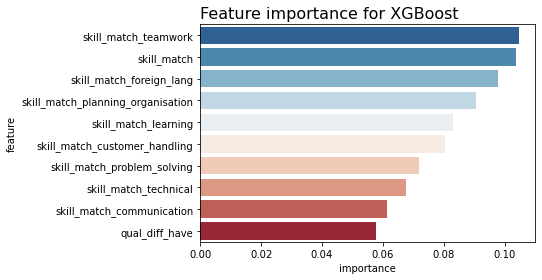

In [63]:
# Plot the feature importance table
xgboost_2_result = pd.concat([xgboost_2_result.sort_values(by='importance', ascending=False).head(10)])
sns.barplot(y = xgboost_2_result.feature, x = xgboost_2_result.importance, palette = "RdBu_r")
plt.title("Feature importance for XGBoost", loc = 'left', fontsize = 16)
plt.show()

In [261]:
roc_auc_score(y2_test, yhat_pp_xgboost_2, multi_class='ovo')

0.6119634277633423

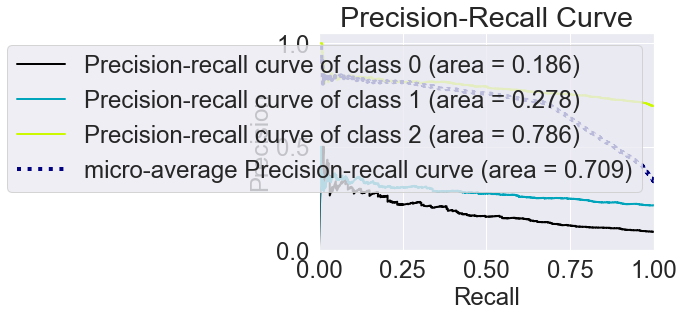

In [263]:
skplt.metrics.plot_precision_recall(y2_test, yhat_pp_xgboost_2)
plt.show()

### Conclusion on boosting and bagging

Once again, our models do not perform better than baseline, with an accuracy score of no greater than 0.70.
Here XGBoost also performs the best as it has a AUC score of 0.617 and precision-recall score of 0.709.

Similarly to all our other findings, the classes perform fairly equally when it comes to the AUC score, however class 2 (high job satisfation) performs a lot better when it comes to the precision recall curve. This implies that for class 2 the classifier is returning accurate results (high precision), as well as returning a majority of all positive results (high recall), however this is not the case for the other classes where recall is very low (0.02 and 0.03 for class 0 and 1 respectively) and precision low (0.39 and 0.34 for class 0 and 1 respectively). 

## Principal Component Analysis

Once again, I finished the investigation by using Principal Component Analysis (PCA) to reduce the dimensionality of the dataset, increasing interpretability but at the same time minimizing information loss. 

In [96]:
pca_2 = PCA(n_components=6)
pca_2.fit(X2)

PCA(n_components=6)

In [97]:
transform_pcs_2 = pd.DataFrame(pca_2.transform(X2), columns=[f'PC_{i+1}' for i in range(pca_2.n_components_)])
transform_pcs_2

,PC_1,PC_2,PC_3,PC_4,PC_5,PC_6
0,2.088690,3.483929,-3.213151,-2.379266,3.318855,-2.407377
1,-4.210048,2.627393,0.053555,1.422133,0.118599,-0.385463
2,1.071089,3.801186,2.613187,-0.440152,2.397511,-0.420028
3,-2.344807,-1.998635,-0.709341,-2.422079,1.840407,0.723885
4,8.042534,-0.503711,-1.711421,-0.694839,-0.295681,-0.016588
...,...,...,...,...,...,...
15555,4.213442,4.570571,-0.785815,1.177402,-0.898642,-0.594474
15556,-6.832302,1.552995,-1.581176,0.091048,-0.213004,-0.146808
15557,-2.099351,-6.165459,-0.298144,-2.474652,2.145629,1.232502
15558,-0.219498,-7.568596,-0.192484,-0.949297,-1.843797,-1.218840


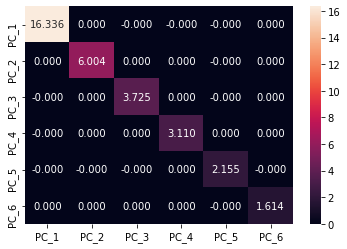

In [98]:
sns.heatmap(transform_pcs_2.cov(), annot=True, fmt='.3f')
plt.show()

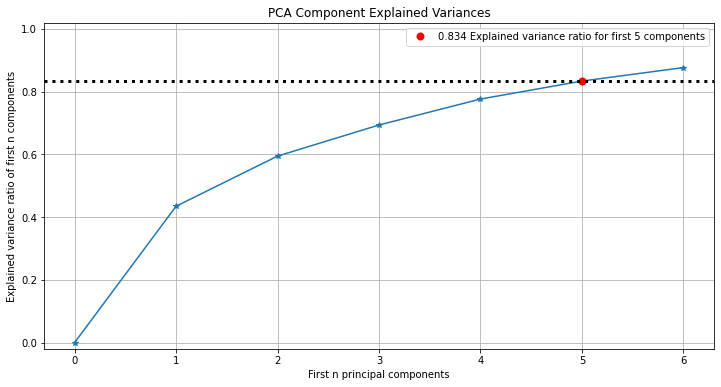

In [99]:
plot_pca_component_variance(pca_2, target_explained_variance=0.8, figsize=(12, 6))
plt.show()

In [101]:
PCA(n_components=5)

PCA(n_components=5)

In [102]:
model_2 = LogisticRegression()

In [103]:
model_2.fit(pca_2.fit_transform(X2_train), y2_train)
print(model_2.score(pca_2.fit_transform(X2_train), y2_train))
print(cross_val_score(model_2, pca_2.fit_transform(X2_train), y2_train, cv=5).mean())

model_2.coef_

0.694810411311054
0.6952120898217216


array([[-0.05988058,  0.10110802,  0.07930005, -0.11627978, -0.08588164,
        -0.12460711],
       [ 0.03068218,  0.02929307, -0.02261131,  0.01316624,  0.01177205,
         0.02619966],
       [ 0.0291984 , -0.13040109, -0.05668874,  0.10311355,  0.07410959,
         0.09840745]])

In [104]:
pca_2.explained_variance_

array([4.6237773 , 3.48683702, 1.32686832, 0.94313833, 0.83294981,
       0.81165975])

In [105]:
pca_2.explained_variance_ratio_

array([0.30822706, 0.23243713, 0.08845078, 0.06287084, 0.05552553,
       0.0541063 ])

Here, 0.834 of the variance could be explained by the first 5 factors, so PCA could reduce the dimensionality and certain components, especially the first two with an explained variance of 0.31 and 0.23 respectively. 

Having said that, once again, using Logistic Regression the cross validated score was not improved greatly.

## Conclusion for Hypothesis 2

This time, we could not predict job satisfaction better than baseline with our skills match predictors. Once again, XGBoost performed best, but here best was not enough. However, with our PCA we did find that dimensionality could be reduced to five factors which explained more than 80% of the variance in the model. 

# Overall Conclusion

One issue we could address with our dataset is the imbalanced classes. For hypothesis 1, class 2 represented 69% of the target variable, class 1 22% and class 0 9% with similar relationships found for hypothesis 2. 

A further investigation could look at whether balancing the classes, either with over sampling or under sampling would benefit our model and produce better results. 